# Data Science Project - Group 002 - Part 1
- Shiri Levin: 205885593
- Ofek kaliff: 315781062
- Chen Halfi: 207024571

### Imports

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import csv
from IPython.display import display
import os
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.metrics import mean_absolute_error 
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import GridSearchCV
from itertools import product
from fancyimpute import IterativeImputer  # MICE
from scipy.stats import zscore
from sklearn.model_selection import train_test_split

# Models
from sklearn.pipeline import Pipeline
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor


#Xplanble Ai
import shap
import lime
import lime.lime_tabular
from lime.lime_tabular import LimeTabularExplainer

##### Set Up

In [5]:
# Print the current working directory
print("Current working directory:", os.getcwd())

is_using_local_system = True

if (is_using_local_system):
    archive_dir = r"C:\Users\amith\Desktop\חן\תואר שני\ds\q1"
else:
    from google.colab import drive
    
    drive.mount('/content/drive')
    archive_dir = '/content/drive/My Drive/DataScienceIntroProject/data'
    
# List files in the directory to check if they exist
if os.path.exists(archive_dir):
    print("Files in archive directory:", os.listdir(archive_dir))
else:
    print("Archive directory does not exist.")

Current working directory: C:\Users\amith\Desktop\חן\תואר שני\ds\q1
Files in archive directory: ['.ipynb_checkpoints', 'CourseProject_Recent_version5.ipynb', 'Data Science Project - Group 002 - Part 1.ipynb', 'Final project summary.docx', 'group_2_output.csv', 'ofek (3).ipynb', 'q1 (2).ipynb', 'q1.ipynb', 'q1_after_editing (5).ipynb', 'Q1_test_dataset.csv', 'Q1_train_dataset.csv', 'requirements.txt', 'Untitled.ipynb', 'xgboost_HyperParams_search.txt', 'xgboost_HyperParams_search1.txt', 'xgboost_HyperParams_search2.txt', 'xgboost_HyperParams_search3.txt', 'xgboost_HyperParams_search4.txt.bak', 'X_train.csv', 'X_val.csv', 'y_train.csv', 'y_val.csv']


### 1.	Initial Data Exploration

This section consists of basic loading of the Q1 dataset, division for train, validation and test, description of the data set and print of a list specifying the type of each feature in the dataset.

In [8]:
# Load each train CSV file into DataFrame
df_train_url = archive_dir + '/Q1_train_dataset.csv'
df_train_all_data = pd.read_csv(df_train_url)
df_train_all_data.title = "df_TRAIN"

# divide df to y_df and X_df
y_train_all_data = df_train_all_data[['SalePrice']]
df_train_all_data = df_train_all_data.drop('SalePrice',axis =1)

# split tra% in dfs to train and validation - 80% train and 20% validation
x_train_df, x_val_df, y_train_df, y_val_df = train_test_split(df_train_all_data, y_train_all_data, test_size=0.2, random_state=42)
x_train_df.title = 'x_train_df'
x_val_df.title = 'x_val_df'
y_train_df.title = 'y_train_df'
y_val_df.title = 'y_val_df'

# Load each test CSV file into DataFrame
df_test_url = archive_dir + '/Q1_test_dataset.csv'
df_test = pd.read_csv(df_test_url)
df_test.title = "df_test"

The goal of this data exploration process was to gain a clear understanding of the dataset's structure and quality. By using the initial_exploration() function, we aimed to examine the dataset’s dimensions, column types, and overall composition while identifying potential data issues, such as missing values. Additionally, by applying the get_columns_with_missing_values() function, we sought to detect columns with excessive missing data (above 60%) and determine whether they should be removed. This process helps ensure data cleanliness and prepares the dataset for further preprocessing and analysis.

In [10]:
files_list = [x_train_df, x_val_df]

# Ensure all columns are displayed without truncation
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)       # Adjust the width to avoid wrapping
pd.set_option('display.max_rows', None)    # Show all rows (if necessary)

# Function to explore data
def initial_exploration(df, title):
    print(f"\n--- Initial Exploration for {title} ---")
    print(f"Shape: {df.shape}")
    print("\nColumns and Data Types:")
    print(df.dtypes)
    missing_values_cut_off = 10
    print(f"\nColoumns With Over {missing_values_cut_off}% Missing Values:")

    # Calculate missing values, total values, and percentage of missing values
    missing_summary = pd.DataFrame({
        'Missing Values': df.isna().sum(),
        'Total Values': df.shape[0],
        'Percentage Missing [%]': ((df.isna().sum() / df.shape[0]) * 100).round(2)
    })
    filtered_summary = missing_summary[missing_summary['Percentage Missing [%]'] >= missing_values_cut_off]
    print(filtered_summary.sort_values(by='Percentage Missing [%]', ascending=False))

    # Display the summary table
    print("\nPreview of Data:")
    display(df.head())

    print(f"\n--- Statistics for {title} ---")
    display(df.describe(include='all'))
    print()

def get_columns_with_missing_values(df, missing_values_cut_off):
   # Calculate percentage of missing values
    missing_summary = pd.DataFrame({
        'Percentage Missing [%]': ((df.isna().sum() / df.shape[0]) * 100).round(2)
    })

    # Filter columns exceeding the cutoff and return as a set
    columns_to_drop = set(missing_summary[missing_summary['Percentage Missing [%]'] > missing_values_cut_off].index)
    return columns_to_drop

# Display initial exploration for each DataFrame
for data_file in files_list:
    initial_exploration(data_file, data_file.title)
    print(f"\n\n Columns that should be removed due to excessive missing values are: {get_columns_with_missing_values(data_file, 60)}\n\n")


--- Initial Exploration for x_train_df ---
Shape: (1968, 79)

Columns and Data Types:
MSSubClass       float64
MSZoning          object
LotFrontage      float64
LotArea          float64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual      float64
OverallCond      float64
YearBuilt        float64
YearRemodAdd     float64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1       float64
BsmtFinType2      object
BsmtFinSF2       float64
BsmtUnfSF    

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
976,75.0,RL,59.0,19876.0,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,2.5Unf,6.0,8.0,NaN,1990.0,Gable,Metal,BrkFace,Wd Sdng,NaN,0.0,TA,ta,BrkTil,TA,TA,NaN,rec,NaN,Unf,NaN,1419.0,1843.0,GasA,Fa,Y,FuseP,1844.0,1078.0,0.0,3687.0,0.0,0.0,4.0,2.0,5.0,1.0,Gd,8.0,Typ,3.0,Gd,Detchd,1993.0,Unf,2.0,761.563437,TA,TA,NaN,687.0,87.0,35.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,12.0,2006.0,WD,Normal
135,20.0,RL,87.0,10754.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8.0,5.0,1999.0,2004.0,Gable,Metal,VinylSd,VinylSd,BrkFace,302.0,gd,TA,PConc,NaN,TA,No,GLQ,1129.0,NaN,482.0,1612.0,3229.0,NaN,Fa,Y,FuseA,1649.0,972.0,0.0,1641.0,NaN,0.0,3.0,0.0,3.0,2.0,Gd,7.0,Typ,1.0,Gd,attchd,2003.0,RFn,NaN,889.371930,ta,TA,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,10.0,2009.0,WD,Normal
25,20.0,RL,70.0,9320.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8.0,5.0,2006.0,2008.0,Gable,Metal,VinylSd,VinylSd,NaN,212.0,Gd,ta,PConc,Gd,TA,No,GLQ,119.0,Unf,0.0,1605.0,1727.0,GasA,Fa,Y,FuseA,1746.0,1005.0,0.0,1724.0,1.0,0.0,3.0,0.0,4.0,1.0,gd,8.0,Typ,0.0,NaN,Attchd,1479.0,RFn,2.0,414.844961,ta,TA,NaN,176.0,30.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,1.0,2007.0,WD,normal
582,20.0,RL,76.0,10303.0,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,4.0,5.0,1952.0,1958.0,Hip,Metal,Wd Sdng,Wd Sdng,BrkFace,141.0,TA,ta,PConc,TA,TA,No,alq,496.0,Unf,0.0,374.0,866.0,GasA,Fa,Y,FuseP,976.0,606.0,0.0,953.0,0.0,0.0,1.0,0.0,4.0,1.0,ta,5.0,Typ,0.0,NaN,attchd,1954.0,Unf,1.0,536.543455,ta,TA,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,2.0,2007.0,WD,Normal
1102,60.0,RL,85.0,11954.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NaN,Norm,Norm,1Fam,2Story,9.0,5.0,2002.0,2009.0,Hip,Metal,WdShing,Wd Shng,Stone,289.0,Ex,ta,PConc,Ex,TA,No,glq,1005.0,Unf,0.0,186.0,1183.0,GasA,Fa,Y,Mix,1192.0,752.0,0.0,2333.0,2.0,0.0,3.0,NaN,5.0,1.0,ex,11.0,Typ,3.0,Gd,builtin,2005.0,Fin,4.0,613.847496,ta,TA,NaN,153.0,27.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,7.0,2006.0,New,Partial



--- Statistics for x_train_df ---


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
count,1865.000000,1858,1557.000000,1878.000000,1848,127,1860,1854,1874,1845,1875,1866,1857,1869,1854,1871,1878.000000,1862.000000,1859.000000,1858.000000,1880,1859,1877,1857,733,1846.000000,1860,1858,1852,1803,1828,1816,1811,1853.000000,1811,1865.000000,1874.000000,1854.000000,1876,1862,1863,1470,1858.000000,1876.000000,1876.000000,1865.000000,1858.000000,1869.000000,1856.00000,1850.000000,1845.000000,1855.000000,1847,1844.000000,1858,1861.000000,976,1795,1791.000000,1761,1861.000000,1856.000000,1791,1770,105,1846.000000,1878.000000,1870.000000,1874.000000,1862.000000,1852.0,9,375,69,1856.0,1866.000000,1878.000000,1853,1879
unique,NaN,7,NaN,NaN,2,2,4,4,2,5,3,26,9,6,5,8,NaN,NaN,NaN,NaN,6,1,15,16,4,NaN,8,9,6,5,5,4,12,NaN,6,NaN,NaN,NaN,5,4,2,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,14,NaN,5,12,NaN,3,NaN,NaN,8,5,3,NaN,NaN,NaN,NaN,NaN,NaN,4,8,3,NaN,NaN,NaN,9,12
top,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,Metal,VinylSd,VinylSd,BrkFace,NaN,ta,TA,PConc,TA,TA,No,glq,NaN,Unf,NaN,NaN,NaN,GasA,Fa,Y,FuseA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ta,NaN,typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,ta,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Ex,mnprv,Shed,NaN,NaN,NaN,WD,Normal
freq,NaN,1433,NaN,NaN,1839,75,1180,1676,1873,1340,1791,289,1609,1852,1535,948,NaN,NaN,NaN,NaN,1473,1859,637,633,555,NaN,569,817,838,798,1665,1190,283,NaN,1589,NaN,NaN,NaN,1845,1832,1743,453,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,471,NaN,865,NaN,486,602,NaN,786,NaN,NaN,863,1692,96,NaN,NaN,NaN,NaN,NaN,NaN,3,109,64,NaN,NaN,NaN,1590,776
mean,57.932976,NaN,68.096981,10030.648030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.124601,5.552095,1971.563744,1984.743272,NaN,NaN,NaN,NaN,NaN,104.248104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,444.766325,NaN,48.065416,559.602988,1055.309061,NaN,NaN,NaN,NaN,1163.785791,717.687633,3.625267,1500.835389,0.658773,0.086677,2.06250,0.578919,3.331165,1.528302,NaN,6.930586,NaN,0.846319,NaN,NaN,1981.746510,NaN,2.219774,475.132390,NaN,NaN,NaN,94.172806,49.028754,24.612834,2.962647,16.980666,inf,NaN,NaN,NaN,inf,6.201501,2007.963791,NaN,NaN
std,42.466262,NaN,24.012079,6246.415131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.416631,1.119522,30.938558,30.187910,NaN,NaN,NaN,NaN,NaN,177.522887,NaN,NaN,NaN,NaN,NaN,NaN,NaN,469.685807,NaN,162.347307,451.887319,479.991850,NaN,NaN,NaN,NaN,438.711989,234.353332,38.440670,557.657903,0.842357,0.374479,0.75119,0.807274,0.974918,0.547754,NaN,1.642344,NaN,0.970547,NaN,NaN,322.770115,NaN,1.015766,215.711501,NaN,NaN,NaN,128.728722,70.209271,66.695918,25.807590,58.145749,NaN,NaN,NaN,NaN,NaN,2.786239,2.601743,NaN,NaN
min,20.000000,NaN,18.000000,1325.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1873.000000,1569.000000,NaN,NaN,NaN,NaN,NaN,-329.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1721.000000,NaN,0.000000,-1309.000000,-2067.000000,NaN,NaN,NaN,NaN,-2083.000000,-1167.000000,0.000000,-2504.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,-3.000000,NaN,NaN,-392.000000,NaN,-3.000000,-622.657302,NaN,NaN,NaN,-391.000000,-258.000000,-71.000000,0.000000,-282.000000,0.0,NaN,NaN,NaN,0.0,-2.000000,2006.000000




 Columns that should be removed due to excessive missing values are: {'MasVnrType', 'PoolQC', 'Alley', 'MiscFeature', 'Fence', 'PavedDrive'}



--- Initial Exploration for x_val_df ---
Shape: (493, 79)

Columns and Data Types:
MSSubClass       float64
MSZoning          object
LotFrontage      float64
LotArea          float64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual      float64
OverallCond      float64
YearBuilt        float64
YearRemodAdd     float64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          ob

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1950,NaN,RL,63.0,9117.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,NaN,5.0,2000.0,2007.0,Gable,Metal,VinylSd,VinylSd,NaN,0.0,NaN,ta,PConc,Gd,TA,Mn,Unf,0.0,Unf,0.0,771.0,796.0,GasA,Fa,Y,Mix,793.0,533.0,0.0,1556.0,0.0,0.0,2.0,1.0,3.0,1.0,Gd,7.0,typ,NaN,NaN,attchd,1655.0,Fin,3.0,407.220393,ta,TA,NaN,0.0,45.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,6.0,2007.0,WD,normal
1752,20.0,RL,NaN,47239.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6.0,5.0,1947.0,1952.0,Hip,Metal,AsbShng,AsbShng,BrkFace,53.0,ta,ta,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,1494.0,1496.0,GasA,Fa,Y,NaN,1488.0,902.0,0.0,1496.0,0.0,0.0,3.0,1.0,3.0,1.0,TA,7.0,Typ,1.0,TA,Attchd,1950.0,RFn,3.0,286.568575,ta,TA,NaN,0.0,0.0,187.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,7.0,2008.0,WD,Family
1087,80.0,RL,97.0,11751.0,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,SLvl,5.0,6.0,1969.0,1968.0,Gable,Metal,VinylSd,VinylSd,BrkFace,101.0,TA,TA,CBlock,NaN,TA,Av,lwq,337.0,ALQ,551.0,287.0,1176.0,GasA,Fa,Y,FuseF,1347.0,792.0,0.0,1340.0,2.0,0.0,2.0,0.0,3.0,1.0,ta,6.0,typ,2.0,Fa,Attchd,NaN,RFn,2.0,393.846880,TA,TA,NaN,168.0,72.0,240.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,5.0,2006.0,WD,abnorml
2350,20.0,NaN,NaN,14445.0,Pave,NaN,IR1,Lvl,NoSeWa,NaN,Gtl,Timber,Norm,Norm,1Fam,SLvl,NaN,6.0,1959.0,1958.0,Gable,Metal,HdBoard,NaN,BrkFace,542.0,ta,TA,CBlock,TA,TA,No,glq,119.0,Rec,358.0,363.0,830.0,GasA,Fa,Y,FuseA,1368.0,808.0,0.0,1344.0,0.0,2.0,1.0,0.0,3.0,2.0,NaN,8.0,Typ,1.0,Gd,Basment,1958.0,RFn,NaN,247.251994,ta,TA,NaN,0.0,120.0,0.0,0.0,235.0,0.0,NaN,NaN,NaN,0.0,1.0,2009.0,COD,Abnorml
2137,30.0,RM,48.0,3601.0,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Artery,Norm,1Fam,1Story,5.0,7.0,NaN,1952.0,Gable,Metal,Stucco,Stucco,NaN,0.0,ta,ta,BrkTil,TA,TA,No,NaN,0.0,NaN,0.0,825.0,824.0,GasA,Fa,Y,FuseP,830.0,525.0,0.0,840.0,0.0,0.0,1.0,0.0,3.0,2.0,TA,6.0,Typ,0.0,NaN,detchd,1922.0,Unf,2.0,341.102362,Fa,Fa,NaN,0.0,0.0,101.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,9.0,2007.0,WD,Normal



--- Statistics for x_val_df ---


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
count,466.000000,462,388.000000,466.000000,468,28,467,464,464,467,470,462,462,464,463,472,471.000000,465.000000,460.000000,459.000000,464,468,467,469,179,457.000000,461,470,464,451,444,439,448,462.000000,441,472.000000,464.000000,467.000000,467,469,464,373,465.000000,468.000000,473.000000,467.000000,466.000000,464.000000,460.000000,465.000000,471.000000,467.000000,471,461.000000,455,459.00000,252,428,446.000000,433,468.000000,459.000000,437,441,23,463.000000,466.000000,462.000000,456.000000,469.000000,458.0,1,86,9,457.0,468.000000,459.000000,467,464
unique,NaN,5,NaN,NaN,2,2,4,4,2,4,3,24,8,6,5,8,NaN,NaN,NaN,NaN,6,1,13,15,3,NaN,7,7,6,5,4,4,12,NaN,6,NaN,NaN,NaN,5,5,2,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,9,NaN,5,11,NaN,3,NaN,NaN,8,5,2,NaN,NaN,NaN,NaN,NaN,NaN,1,8,2,NaN,NaN,NaN,9,9
top,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,Metal,VinylSd,VinylSd,BrkFace,NaN,ta,ta,PConc,TA,TA,No,unf,NaN,Unf,NaN,NaN,NaN,GasA,Fa,Y,FuseA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ta,NaN,Typ,NaN,Gd,attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Ex,MnPrv,Shed,NaN,NaN,NaN,WD,normal
freq,NaN,364,NaN,NaN,467,19,280,408,463,353,440,63,400,458,391,242,NaN,NaN,NaN,NaN,374,468,169,167,137,NaN,145,233,202,206,416,299,75,NaN,383,NaN,NaN,NaN,457,458,435,109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,122,NaN,224,NaN,122,141,NaN,180,NaN,NaN,208,424,20,NaN,NaN,NaN,NaN,NaN,NaN,1,22,8,NaN,NaN,NaN,416,199
mean,55.493562,NaN,70.481959,10762.128755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.070064,5.647312,1970.143478,1986.235294,NaN,NaN,NaN,NaN,NaN,110.855580,NaN,NaN,NaN,NaN,NaN,NaN,NaN,433.766234,NaN,57.527542,539.368534,1062.546039,NaN,NaN,NaN,NaN,1182.101075,716.023504,8.820296,1530.085653,0.648069,0.088362,2.034783,0.582796,3.373673,1.556745,NaN,7.030369,NaN,0.87146,NaN,NaN,1991.049327,NaN,2.237179,468.296556,NaN,NaN,NaN,95.850972,55.532189,20.426407,2.333333,14.575693,inf,NaN,NaN,NaN,inf,6.198718,2007.745098,NaN,NaN
std,40.894211,NaN,23.008417,11266.330298,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.464973,1.098745,30.764993,30.033627,NaN,NaN,NaN,NaN,NaN,205.960791,NaN,NaN,NaN,NaN,NaN,NaN,NaN,470.009920,NaN,186.258613,446.434432,508.077901,NaN,NaN,NaN,NaN,444.485881,212.319124,73.248239,537.070560,0.850406,0.375770,0.763325,0.826634,0.929692,0.534730,NaN,1.608115,NaN,0.97727,NaN,NaN,304.953726,NaN,1.012421,198.820566,NaN,NaN,NaN,132.178113,77.165762,62.403887,23.604774,55.055150,NaN,NaN,NaN,NaN,NaN,2.739402,1.949794,NaN,NaN
min,20.000000,NaN,18.000000,1508.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,3.000000,1867.000000,1524.000000,NaN,NaN,NaN,NaN,NaN,-67.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,-1688.000000,-1677.000000,NaN,NaN,NaN,NaN,-1672.000000,-976.000000,0.000000,-1691.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,3.000000,NaN,-3.00000,NaN,NaN,-186.000000,NaN,-3.000000,12.426866,NaN,NaN,NaN,-159.000000,-29.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,0.0,-2.000000,2006.000000,NaN,NaN
25%,20.000000,NaN,57.750000,7310.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,




 Columns that should be removed due to excessive missing values are: {'MasVnrType', 'PoolQC', 'Alley', 'MiscFeature', 'Fence', 'PavedDrive'}




### 2.	EDA

This section contains several important visualizations that helped us understand few of the problems in this dataset

#### Visualizing X

The visualizes of numerical and categorical feature distributions in a dataset to identify patterns and potential issues.

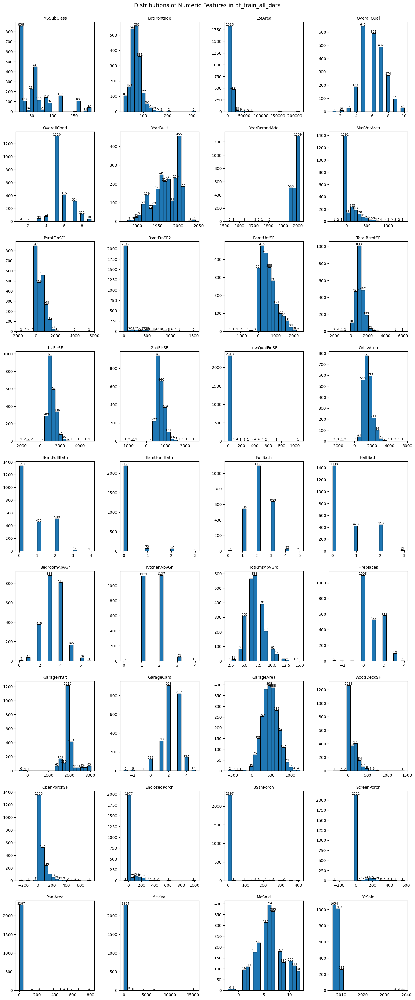

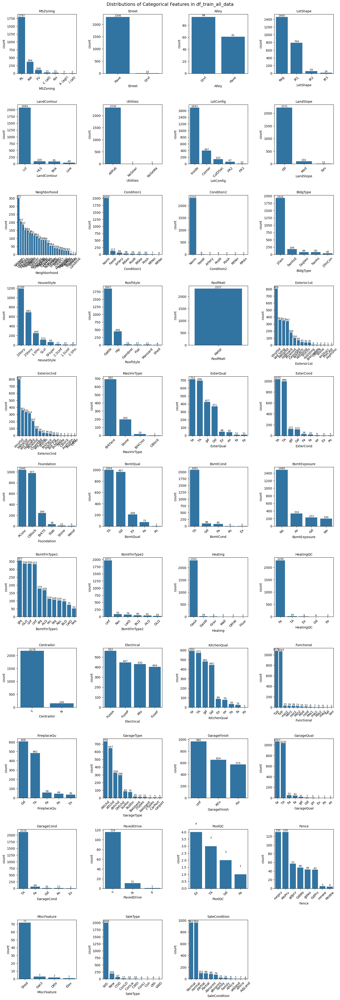

In [15]:
def display_stats_and_visuals(df, title):
    # Visualize numeric columns
    numeric_cols = df.select_dtypes(include='number').columns
    if not numeric_cols.empty:
        num_cols = 4  # Number of columns in the subplot grid
        num_rows = int(np.ceil(len(numeric_cols) / num_cols))  # Calculate rows needed

        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))  # Create subplots
        fig.suptitle(f"Distributions of Numeric Features in {title}\n\n", fontsize=14)  # Set overall title

        for i, col in enumerate(numeric_cols):
            row = i // num_cols
            col_index = i % num_cols
            ax = axes[row, col_index]

            df[col] = df[col].replace([np.inf, -np.inf], np.nan)  # Replace infinite values with NaN

            # Drop NaN values before plotting
            counts, bins, patches = ax.hist(df[col].dropna(), bins=20, edgecolor='black')
            ax.set_title(col, fontsize=10)

            # Annotate each bar with count (placed on top of bars)
            for count, patch in zip(counts, patches):
                if count > 0:  # Avoid labels on empty bins
                    ax.text(patch.get_x() + patch.get_width() / 2, count + 0.5, f"{int(count)}",
                            ha='center', va='bottom', fontsize=8, color='black')

        for i in range(len(numeric_cols), num_rows * num_cols):
            row = i // num_cols
            col_index = i % num_cols
            fig.delaxes(axes[row, col_index])

        plt.tight_layout(pad=2.0)
        plt.show()

    # Visualize categorical columns
    categorical_cols = df.select_dtypes(include='object').columns
    if not categorical_cols.empty:
        num_cols = 4  # Number of columns in the subplot grid
        num_rows = int(np.ceil(len(categorical_cols) / num_cols))  # Calculate rows needed

        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))  # Create subplots
        fig.suptitle(f"Distributions of Categorical Features in {title}\n\n", fontsize=14)  # Set overall title

        for i, col in enumerate(categorical_cols):
            row = i // num_cols
            col_index = i % num_cols
            ax = axes[row, col_index]

            sns_plot = sns.countplot(x=col, data=df, order=df[col].value_counts().index, ax=ax)
            ax.set_title(col, fontsize=10)
            ax.tick_params(axis='x', rotation=45)

            # Annotate bars with count values (placed on top of bars)
            for p in ax.patches:
                count = p.get_height()
                if count > 0:  # Avoid labels on empty bars
                    ax.text(p.get_x() + p.get_width() / 2, count + 0.5, f"{int(count)}",
                            ha='center', va='bottom', fontsize=8, color='black')

        for i in range(len(categorical_cols), num_rows * num_cols):
            row = i // num_cols
            col_index = i % num_cols
            fig.delaxes(axes[row, col_index])

        plt.tight_layout(pad=2.0)
        plt.show()


# Display statistics and visualizations for each DataFrame
display_stats_and_visuals(df_train_all_data, "df_train_all_data")

Conclosions from the visualiztion of the distributions:
- We found that few of the features had the same categories written with both lower and upper case (e.g. ExterQual).
- We found that few of the categorical features had big cardinality (e.g. Neighborhood).
- We found that some of features have a predominant single value (e.g PoolArea) and RoofMatl has only one category.
- We observed various distributions across different variables, some with long tails and others resembling a normal distribution and others with other   distribution.
- We found that years features that is more then 2025 (e.g. yearBulit)
- We found there are several features that contains values that there frequency in vary low (e.g. houseStyle: 2.5Fin, 1.5Unf, 2.5Unf).

The function check_garage_year_vs_sale(df) aims to identify and visualize cases where the recorded garage construction year (GarageYrBlt) is later than the year of sale (YrSold), which would indicate incorrect or inconsistent data. It calculates the garage's age at the time of sale, filters valid cases, and counts invalid cases where the garage was supposedly built after the sale. The function then generates a bar plot to compare the number of valid and invalid cases and prints a summary of the findings.

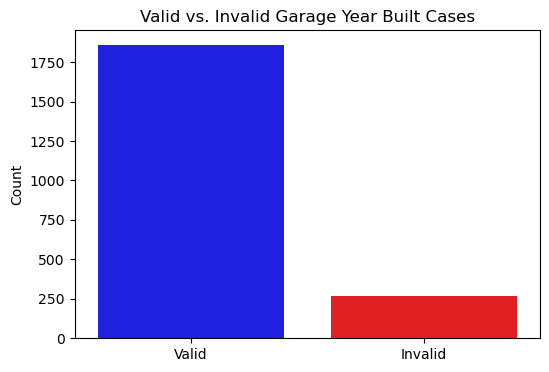

Found 271 cases where GarageYrBlt > YrSold.


In [18]:
def check_garage_year_vs_sale(df):
    if 'GarageYrBlt' in df.columns and 'YrSold' in df.columns:
        # Create a new variable: Building age at the time of sale
        df['BuildingAgeAtSale'] = df['YrSold'] - df['GarageYrBlt']
        
        # Filter only cases where the value is valid
        df_valid = df[df['BuildingAgeAtSale'] >= 0]

        # Count cases where the building age is invalid
        invalid_count = (df['BuildingAgeAtSale'] < 0).sum()

        # Plot showing the number of valid vs. invalid values
        plt.figure(figsize=(6, 4))
        sns.barplot(x=["Valid", "Invalid"], y=[len(df_valid), invalid_count], palette=["blue", "red"])
        plt.ylabel("Count")
        plt.title("Valid vs. Invalid Garage Year Built Cases")
        plt.show()
        
        print(f"Found {invalid_count} cases where GarageYrBlt > YrSold.")
    else:
        print("Columns 'GarageYrBlt' and/or 'YrSold' are missing from the DataFrame.")

# Call the function with your DataFrame
check_garage_year_vs_sale(df_train_all_data)

The goal is to find the features that has one dominant value (missing or other):

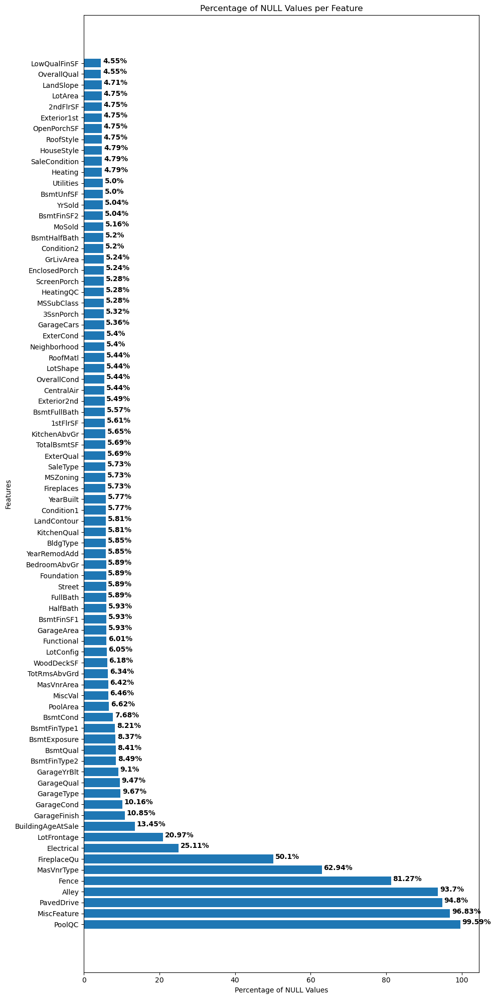

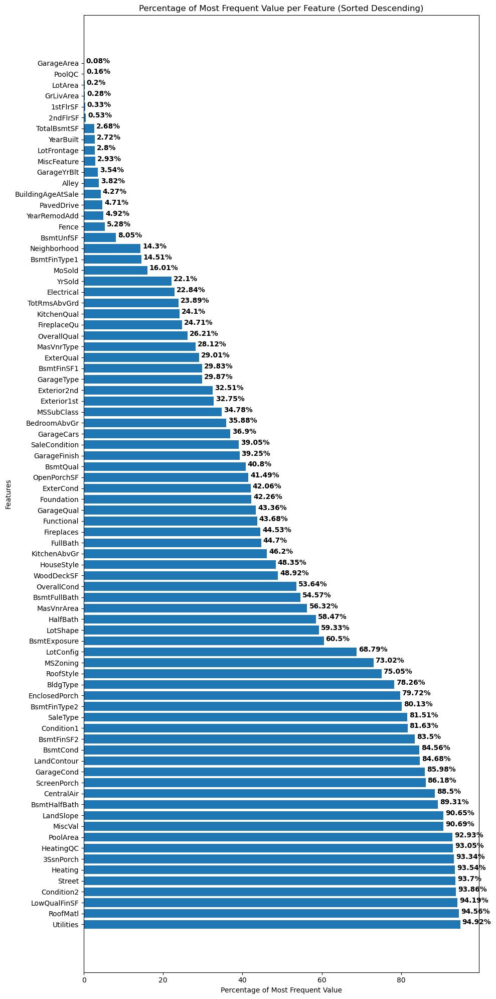

In [20]:
def plot_missing_precentage(df):
    # Calculate the percentage of NULL values for each column
    null_percentages = df.isnull().sum() / len(df) * 100
    # Sort values in descending order
    null_percentages = null_percentages.sort_values(ascending=False)
    # Create a horizontal bar plot
    plt.figure(figsize=(10, 20))  # Set figure size
    plt.barh(null_percentages.index, null_percentages.values)  # Use barh for horizontal bar plot
    plt.xlabel('Percentage of NULL Values')
    plt.ylabel('Features')
    plt.title('Percentage of NULL Values per Feature')

    # Add percentage values next to each bar
    for i, v in enumerate(null_percentages.values):
        plt.text(v + 0.5, i, str(round(v, 2)) + '%', color='black', fontweight='bold')  # Round to 2 decimal places

    plt.tight_layout()  # Adjust spacing
    plt.show()


def plot_mode_precentage(df):
    # Calculate the percentage of the most frequent value for each column
    most_frequent_percentages = df.apply(lambda x: x.value_counts().iloc[0] / len(x) * 100)

    # Sort values in descending order
    most_frequent_percentages = most_frequent_percentages.sort_values(ascending=False)

    # Create a horizontal bar plot
    plt.figure(figsize=(10, 20))  # Set figure size
    plt.barh(most_frequent_percentages.index, most_frequent_percentages.values)  # Use barh for horizontal bar plot
    plt.xlabel('Percentage of Most Frequent Value')
    plt.ylabel('Features')
    plt.title('Percentage of Most Frequent Value per Feature (Sorted Descending)')

    # Add percentage values next to each bar
    for i, v in enumerate(most_frequent_percentages.values):
        plt.text(v + 0.5, i, str(round(v, 2)) + '%', color='black', fontweight='bold')  # Round to 2 decimal places

    plt.tight_layout()  # Adjust spacing
    plt.show()


plot_missing_precentage(df_train_all_data)
plot_mode_precentage(df_train_all_data)


From the graphs, it can be seen that there are many features with a large number of records containing NaN values.
Additionally, there are many features with a single dominant value, which requires special attention.

#### Visualizing Y
Analyze the Y data to better understand how the dataset behaves To ensure that there are no unreasonable values.

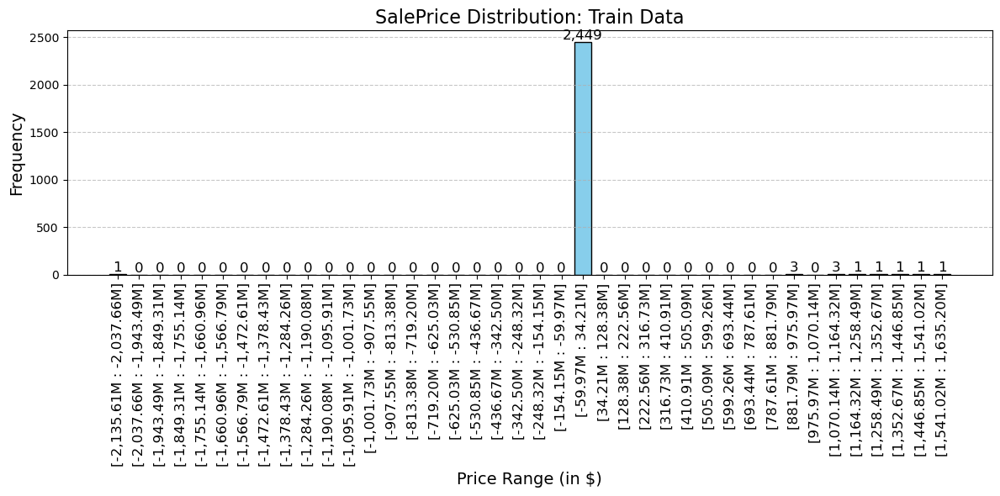

In [23]:
def visualize_saleprice_distribution(y_df, title):
    """
    Visualizes the distribution of the SalePrice column in the y_df DataFrame
    as a histogram with 20 bins, displaying the frequency on top of each bar.
    The frequency and the x-axis labels are formatted with commas and rounded to two decimal places.

    Args:
        y_df (pd.DataFrame): DataFrame containing the SalePrice column.
        title (str): Title of the plot.
    """
    # Get min and max values of SalePrice
    min_value = y_df["SalePrice"].min()
    max_value = y_df["SalePrice"].max()

    # Create bins for the range of SalePrice
    bins = pd.cut(y_df["SalePrice"], bins=40, include_lowest=True)

    # Count occurrences in each bin
    bin_counts = bins.value_counts().sort_index()

    # Plot the bar chart
    plt.figure(figsize=(12, 6))
    bars = plt.bar(bin_counts.index.astype(str), bin_counts.values, color='skyblue', edgecolor='black')

    # Add frequency text on top of each bar with formatted numbers
    for bar in bars:
        height = bar.get_height()
        # Format the number with commas and no decimal places
        formatted_height = f"{height:,.0f}"
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.1, formatted_height,
                 ha='center', va='bottom', fontsize=12)

    # Format the x-axis labels (Price ranges) with commas and rounded to two decimal places
    formatted_labels = []
    devide_coeff = 1000_000
    for label in bin_counts.index:
        lower_bound, upper_bound = label.left/devide_coeff, label.right/devide_coeff
        formatted_range = f"[{lower_bound:,.2f}M : {upper_bound:,.2f}M]"
        formatted_labels.append(formatted_range)

    plt.xticks(ticks=range(len(formatted_labels)), labels=formatted_labels, rotation=90, fontsize=12)

    # Set the title and labels
    plt.title(f"SalePrice Distribution: {title}", fontsize=16)
    plt.xlabel("Price Range (in $)", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Assuming y_train_df is the dataframe with 'SalePrice'
visualize_saleprice_distribution(y_train_all_data, "Train Data")


There were several illogical sale prices in dataset such as a negative value or over a billion-dollar sale price, we dropped every one of this data points. This can be corrected by removing unreasonable values from the dataset.
The rows that contains illogical Y was deleted from the datasets. 

In [25]:
def filter_data_by_saleprice(x_df, y_df, lower_threshold, upper_threshold):
    """
    Filters rows in both x_df and y_df where the value of "SalePrice" in y_df
    is outside the specified thresholds.

    Args:
        x_df (pd.DataFrame): DataFrame containing independent variables.
        y_df (pd.DataFrame): DataFrame containing the "SalePrice" column.
        lower_threshold (float): The lower bound for "SalePrice".
        upper_threshold (float): The upper bound for "SalePrice".

    Returns:
        tuple: Filtered versions of x_df and y_df.
    """
    # Ensure y_df contains the "SalePrice" column
    if "SalePrice" not in y_df.columns:
        raise ValueError("The y_df DataFrame must contain a 'SalePrice' column.")

    # Create a mask for rows where SalePrice is within the thresholds
    mask = (y_df["SalePrice"] >= lower_threshold) & (y_df["SalePrice"] <= upper_threshold)

    # Filter both x_df and y_df using the mask
    x_df_filtered = x_df[mask].reset_index(drop=True)
    y_df_filtered = y_df[mask].reset_index(drop=True)

    return x_df_filtered, y_df_filtered

x_train_df, y_train_df = filter_data_by_saleprice(x_train_df, y_train_df, 0, 100_000_000)
x_val_df, y_val_df = filter_data_by_saleprice(x_val_df, y_val_df, 0, 100_000_000)

df_train_all_data, y_train_all_data = filter_data_by_saleprice(df_train_all_data, y_train_all_data, 0, 100_000_000)

#### Visualize y after transformation
After removing the outliers, we can see that the resulting distribution is more reasonable.

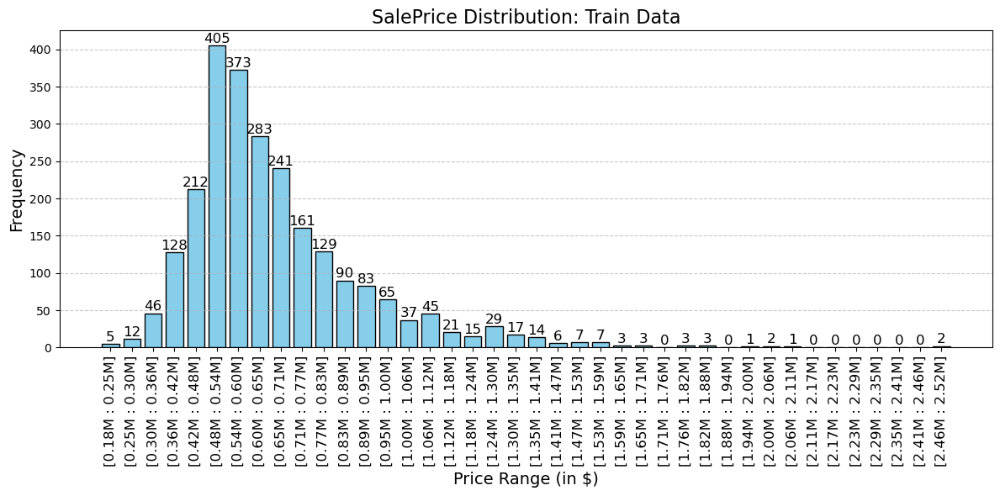

In [27]:
# Assuming y_train_df is the dataframe with 'SalePrice'
visualize_saleprice_distribution(y_train_all_data, "Train Data")

### 3.	Missing Values

The figure **Percentage of NULL Values per Feature** shows a missing values problem that we decided to handle in two different ways:
- the features that had too more missing values from the treshold - we decided to drop them (e.g. PoolQC).
- the features that had less missing values from the treshold we treated with different approaches for handling missing values that was covered in class. We implemented the following imputation methods: median, knn and mice for numerical features and knn and mode for categorical features.

In [30]:
def handle_missing_data(df, imputation_method='median', imputation_method_categorical='mode', k=5, use_mice_for_numerical=False):
    """
    Handles missing data in the dataset using specified imputation methods for numerical and categorical columns.
    
    Args:
        df (pd.DataFrame): Input dataset.
        imputation_method (str): Imputation method for numerical data ('knn', 'median', or 'mice').
        imputation_method_categorical (str): Imputation method for categorical data ('knn' or 'mode').
        k (int): Number of neighbors for KNN imputation (only used if imputation_method is 'knn').
        use_mice_for_numerical (bool): If True, use MICE for numerical columns imputation.

    Returns:
        pd.DataFrame: Dataset with missing values imputed.
    """
    if not isinstance(df, pd.DataFrame):
        raise TypeError("Input must be a pandas DataFrame.")
    if imputation_method not in ['knn', 'median', 'mice']:
        raise ValueError("Invalid imputation method for numerical columns. Choose 'knn', 'median', or 'mice'.")
    if imputation_method_categorical not in ['knn', 'mode']:
        raise ValueError("Invalid imputation method for categorical columns. Choose 'knn' or 'mode'.")

    df = df.copy()  # Work on a copy to avoid modifying original data

    # Separate numerical and categorical features
    num_cols = df.select_dtypes(include=['float64', 'int64']).columns
    cat_cols = df.select_dtypes(include=['object']).columns

    # Replace infinite values with NaN before imputation
    df[num_cols] = df[num_cols].replace([np.inf, -np.inf], np.nan)

    # Impute missing values for numerical columns
    if use_mice_for_numerical:
        # Apply MICE (Iterative Imputer) for numerical columns
        mice_imputer = IterativeImputer(max_iter=10, random_state=0)
        df[num_cols] = mice_imputer.fit_transform(df[num_cols])
    
    elif imputation_method == 'knn':
        knn_imputer = KNNImputer(n_neighbors=k)
        df[num_cols] = knn_imputer.fit_transform(df[num_cols])
    elif imputation_method == 'median':
        median_imputer = SimpleImputer(strategy='median')
        df[num_cols] = median_imputer.fit_transform(df[num_cols])

    # Fallback to ensure no missing values remain in numerical columns
    if df[num_cols].isna().any().any():
        print("Fallback: Using median imputation for remaining NaNs in numerical columns.")
        df[num_cols] = SimpleImputer(strategy='median').fit_transform(df[num_cols])

    # Impute missing values for categorical columns
    if imputation_method_categorical == 'knn':
        # Encode categorical values as numbers for KNN
        encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
        df[cat_cols] = encoder.fit_transform(df[cat_cols])

        # Apply KNN Imputer
        knn_imputer = KNNImputer(n_neighbors=k)
        df[cat_cols] = knn_imputer.fit_transform(df[cat_cols])

        # Decode categorical values back to original categories
        df[cat_cols] = encoder.inverse_transform(df[cat_cols])
    
    elif imputation_method_categorical == 'mode':
        for col in cat_cols:
            if df[col].isna().any():
                mode_value = df[col].mode()[0]  # Get mode (most frequent value)
                df[col] = df[col].fillna(mode_value)  # Replace NaNs with mode

    return df

### 4.	Outliers Analysis

#### Replacing Outliars Values
In this section we implemented another generic function that we used in the preprocess pipeline. The function can handle outliers based on various method discussed in class: iqr, zscore and lof. 
**Outliars detaction methods:**
##### 1. LOF (Local Outlier Factor)  
Detects anomalies based on local density differences.  
Use when: Data is complex, non-uniform, or has clusters with varying densities.  

##### 2. IQR (Interquartile Range)  
Identifies outliers based on statistical spread (Q1, Q3).  
Use when: Data is skewed or non-normal, and you need a simple, robust method.  

##### 3. Z-Score  
Flags points far from the mean based on standard deviations.  
Use when: Data follows a normal distribution and extreme values need detection

In the grid search phase, the best method and it’s best param will be chosen that returen the best MAE. 

In [33]:
def handle_outliers_in_data(df, method='iqr', z_thresh=3.0, iqr_param=1.5, n_neighbors=20, contamination=0.05, impute_missing=False):
    """
    Handles outliers in the dataset using IQR, Z-Score, or Local Outlier Factor (LOF).
    Instead of removing rows, replaces outliers with imputed values.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        method (str): The method to detect outliers ('iqr', 'zscore', or 'lof').
        z_thresh (float): Z-score threshold for outlier detection (if method='zscore').
        iqr_param (float): IQR-based threshold for outlier detection (if method='iqr').
        n_neighbors (int): Number of neighbors for LOF (if method='lof').
        contamination (float): Proportion of outliers for LOF (if method='lof').
        impute_strategy (str): Strategy to fill outliers ('mean', 'median', or 'most_frequent').

    Returns:
        pd.DataFrame: The DataFrame with outliers replaced.
    """
    num_cols = df.select_dtypes(include=['float64', 'int64']).columns
    imputer = SimpleImputer(strategy='median')

    if method == 'iqr':
        for col in num_cols:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - iqr_param * IQR
            upper_bound = Q3 + iqr_param * IQR
            # Mask outliers with NaN
            df[col] = df[col].mask((df[col] < lower_bound) | (df[col] > upper_bound))
        if impute_missing:
            # Impute the outliers (now NaNs)
            df[num_cols] = imputer.fit_transform(df[num_cols])

    elif method == 'zscore':
        z_scores = zscore(df[num_cols])
        for i, col in enumerate(num_cols):
            df[col] = df[col].mask(np.abs(z_scores.iloc[:, i]) > z_thresh)
        if impute_missing:
            # Impute the outliers (now NaNs)
            df[num_cols] = imputer.fit_transform(df[num_cols])

    elif method == 'lof':
        lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
        outlier_predictions = lof.fit_predict(df[num_cols])
        # Mask outliers with NaN
        for i, col in enumerate(num_cols):
            df.loc[outlier_predictions == -1, col] = np.nan
        if impute_missing:
            # Impute the outliers (now NaNs)
            df[num_cols] = imputer.fit_transform(df[num_cols])

    else:
        raise ValueError("Invalid method. Choose from 'iqr', 'zscore', or 'lof'.")

    return df


#### Handling illogical years

- Based on the histograms, we identified that some year-related features contained illogical values (e.g., years greater than 2025). These values were replaced with `NaN` using the function `replace_illegal_data_YrSold_and_GarageYrBlt_and_negative_with_nan()`.  
- According to the **Valid vs. Invalid Garage Year Built Cases** figure, 271 illogical rows were found. Both values in these cases were replaced with `NaN` using the function `replace_unlogical_combination_of_years_to_nan()`.  


In [35]:
def replace_ilegal_data_YrSold_and_GarageYrBlt_and_negative_with_nan(df):
    new_df=df.copy()
    # Handling numeric columns: removing negative values and INF
    numeric_cols = new_df.select_dtypes(include=[np.number]).columns
    new_df[numeric_cols] = new_df[numeric_cols].map(lambda x: np.nan if x < 0 or np.isinf(x) else x)

    # Handling the columns GarageYrBlt and YrSold: removing values greater than 2025
    for col in ['GarageYrBlt', 'YrSold']:
        if col in new_df.columns:
            if col in new_df.columns:
                new_df[col] = new_df[col].apply(lambda x: np.nan if x > 2025 else x)

    return new_df

In [36]:
def repalce_unlogical_combination_of_years_to_nan(df):
    """
    Replaces YearBuilt and YearRemodAdd with NaN where YearBuilt is greater than YearRemodAdd.
    Logs the number of invalid instances before and after replacement.
    
    Args:
        df (pd.DataFrame): Input DataFrame containing 'YearBuilt' and 'YearRemodAdd' columns.
    
    Returns:
        pd.DataFrame: Modified DataFrame with invalid years replaced by NaN.
    """
    if not {'YearBuilt', 'YearRemodAdd'}.issubset(df.columns):
        raise ValueError("DataFrame must contain 'YearBuilt' and 'YearRemodAdd' columns.")
    
    # Count how many invalid rows exist before replacement
    invalid_count_before = (df['YearBuilt'] > df['YearRemodAdd']).sum()
    #print(f" Found {invalid_count_before} invalid (YearBuilt > YearRemodAdd) instances before correction.")
    
    # Replace invalid values with NaN
    df.loc[df['YearBuilt'] > df['YearRemodAdd'], ['YearBuilt', 'YearRemodAdd']] = np.nan
    
    # Count how many invalid rows remain after replacement (should be zero)
    invalid_count_after = (df['YearBuilt'] > df['YearRemodAdd']).sum()
    #print(f" Fixed! {invalid_count_after} invalid instances remain after correction.")
    
    return df

### 5.	Feature Engineering: 

#### Transformation 
After analyzing the distribution of the features, we decided to apply transformations to improve their statistical properties. We implemented four different transformation methods:  
- **Log Transformation (LOG):**  
Useful for reducing right-skewed distributions (long right tail) and helps stabilize variance and make the data more normally distributed.  

- **Z-Score Standardization (Z-SCORE):**  
Standardizes the data by transforming it into a standard normal distribution.  
   
- **Min-Max Scaling (MIN-MAX):**  
Rescales the values to a fixed range [0, 1]. Is Useful when preserving relative relationships between values.  
   
- **Best Transformation (BEST):**  
The best transformation method is selected separately for each feature based on its skewness.  
If the skewness is high, a log transformation is applied. If the feature is already close to a normal distribution, Z-score standardization or Min-Max scaling is used.  

By searching for the most appropriate transformation per feature through grid search, we aim to improve the feature distribution, enhance model performance, and ensure better interpretability of the data.  


In [39]:
def suggest_transformation(df, feature):
    """
    This function checks whether a transformation is needed for a specific feature and if so, which one.

    Args:
        df: DataFrame containing the feature.
        feature: Name of the feature.

    Returns:
        None or the recommended transformation name (LOG, Z_SCORE, MIN_MAX).
    """

    # Check the data type of the feature
    if df[feature].dtype == 'object':
        return None  # No transformation needed for categorical features

    # Check the distribution of the feature
    skewness = stats.skew(df[feature])

    # Recommend transformation based on the distribution
    if abs(skewness) > 1:  # Highly skewed distribution
        return 'LOG'
    elif abs(skewness) > 0.5:  # Moderately skewed distribution
        return 'Z_SCORE'
    else:  # Symmetrical distribution
        return 'MIN_MAX'


In [40]:
def log_transform(df, feature):
    """
    This function performs a LOG transformation on a specific feature.

    Args:
        df: DataFrame containing the feature.
        feature: Name of the feature.

    Returns:
        DataFrame with the transformed feature.
    """
    df.loc[:, feature] = np.log1p(df[feature])  # log1p handles zeros, use .loc for assignment
    return df

def z_score_transform(df, feature):
    """
    This function performs a Z-score transformation on a specific feature.

    Args:
        df: DataFrame containing the feature.
        feature: Name of the feature.

    Returns:
        DataFrame with the transformed feature.
    """
    scaler = StandardScaler()
    df.loc[:, feature] = scaler.fit_transform(df[[feature]])  # Use .loc for assignment
    return df

def min_max_transform(df, feature):
    """
    This function performs a Min-Max transformation on a specific feature.

    Args:
        df: DataFrame containing the feature.
        feature: Name of the feature.

    Returns:
        DataFrame with the transformed feature.
    """
    scaler = MinMaxScaler()
    df.loc[:, feature] = scaler.fit_transform(df[[feature]])  # Use .loc for assignment
    return df

In [41]:
def apply_transformation(df, feature, transformation_type):
    """
    This function applies a transformation to a specific feature based on the transformation type.

    Args:
        df: DataFrame containing the feature.
        feature: Name of the feature.
        transformation_type: Type of transformation (LOG, Z_SCORE, MIN_MAX).

    Returns:
        DataFrame with the transformed feature.
    """
    if transformation_type == 'LOG':
        return log_transform(df, feature)
    elif transformation_type == 'Z_SCORE':
        return z_score_transform(df, feature)
    elif transformation_type == 'MIN_MAX':
        return min_max_transform(df, feature)
    else:
        return df  # No transformation if type is invalid

#### Data Cleaning:
The code provides functions for handling and optimizing categorical and numerical data in a Pandas DataFrame. It identifies highly dominant categorical and numerical columns where more than 99% of the values belong to a single category or value, respectively. It also unifies categorical values by converting them to lowercase for consistency. Additionally, it detects rare categories in categorical columns where the frequency is below 5% and merges them into a common "Others" category. These preprocessing steps help clean and standardize the data, reducing noise and improving the performance of machine learning models

In [43]:
#The data was classified by variables to determine whether to perform Label Encoding- on
# the ordinal features or One Hot Encoding on the categorical features

# Function to apply label encoding while keeping NaN as NaN
def label_encoding(df, encoding_map):
    new_df = df.copy()
    for col, mapping in encoding_map.items():
        if col in new_df.columns:
            # Apply the map only for the non-NaN values, keeping NaN values intact
            new_df[col] = new_df[col].apply(lambda x: mapping.get(x, np.nan) if pd.notna(x) else np.nan)
    return new_df

def replace_ordinal_to_numerical(df_new):
    df = df_new.copy()
    # Retrieve numeric columns
    numeric_cols = x_train_df.select_dtypes(include='number').columns
    
    # Retrieve categorical columns (include the ordinal features)
    categorical_cols = x_train_df.select_dtypes(include='object').columns
    
    # Define ordinal features in the train dataset
    ordinal_columns_include_numeric = ['OverallQual', 'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC']
    
    # Filter only categorical ordinal columns
    ordinal_columns = [col for col in ordinal_columns_include_numeric  if col in categorical_cols]
    
    # Remove ordinal columns from categorical columns
    categorical_cols_without_ordinal = [col for col in categorical_cols if col not in ordinal_columns]
    
    # Common mapping for ordinal features
    common_mapping = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}
    
    # Apply the common mapping for all ordinal features
    encoding_map = {col: common_mapping for col in [
        'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'KitchenQual',
        'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC'
    ]}
    
    x_train_df_new = label_encoding(df, encoding_map)
    
    # Fill missing values in ordinal columns using the most frequent value (Mode)
    for col in ordinal_columns:  # Loop through the list of ordinal columns
        if x_train_df_new[col].isnull().sum() > 0:  # Check if there are any missing values in the column
            most_frequent = x_train_df_new[col].mode()[0]  # Calculate the most frequent value in the column
            x_train_df_new[col] = x_train_df_new[col].fillna(most_frequent)  # Fill missing values with the most frequent value            
    
    return x_train_df_new

In [44]:
def get_highly_dominant_categorical_columns(df_data_train, threshold=0.99):
    """
    Identifies categorical columns where more than `threshold` proportion of the data belongs to a single category.

    Parameters:
        df (pd.DataFrame): Input DataFrame.
        threshold (float): Threshold for the dominant category proportion. Default is 0.99.

    Returns:
        set: A set of column names that meet the criteria.
    """
    columns_to_flag = set()
    df = df_data_train
    for col in df.select_dtypes(include=['object', 'category']).columns:
        # Calculate the proportion of the most frequent category
        df[col] = df[col].str.lower()
        max_category_proportion = df[col].value_counts(normalize=True).max()

        if max_category_proportion > threshold:
            columns_to_flag.add(col)

    return columns_to_flag

def get_highly_dominant_numerical_columns(df, threshold=0.99):
    """
    Identifies numerical columns where more than `threshold` proportion of the data belongs to a single value.

    Parameters:
        df (pd.DataFrame): Input DataFrame.
        threshold (float): Threshold for the dominant value proportion. Default is 0.99.

    Returns:
        set: A set of column names that meet the criteria.
    """
    columns_to_drop = set()

    for col in df.select_dtypes(include=['number']).columns:
        # Calculate the proportion of the most frequent value
        value_counts = df[col].value_counts(normalize=True)
        if not value_counts.empty:
            max_value_proportion = value_counts.max()

            # Check if the max proportion exceeds the threshold
            if max_value_proportion > threshold:
                columns_to_drop.add(col)

    return columns_to_drop

def unify_categorical_case(df):
    """
    Transforms a DataFrame such that for all categorical columns,
    categories differing only by case (e.g., 'Apple' and 'apple') are unified.

    Parameters:
        df (pd.DataFrame): Input DataFrame.

    Returns:
        pd.DataFrame: Transformed DataFrame with unified categories in categorical columns.
    """
    transformed_df = df.copy()

    for col in transformed_df.select_dtypes(include=['object', 'category']).columns:
        # Create a mapping of original category to lowercased category
        mapping = {val: val.lower() for val in transformed_df[col].unique() if isinstance(val, str)}

        # Map the column values to the unified category
        transformed_df[col] = transformed_df[col].map(mapping)

    return transformed_df


In [45]:
def find_small_categories_for_all_features(df_data_train, threshold=0.05):
    """
    Identify small categories for all categorical features in a DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the features to be analyzed.
    threshold (float): The frequency threshold below which categories will be identified. Default is 0.05.

    Returns:
    dict: A dictionary where keys are column names and values are lists of small categories.
    """
    small_categories_dict = {}
    df = df_data_train
    for column in df.select_dtypes(include=['object', 'category']).columns:
        # Convert all values in the column to lowercase
        df[column] = df[column].str.lower()
        counts = df[column].value_counts(normalize=True)
        small_categories = counts[counts < threshold].index.tolist()
        small_categories_dict[column] = small_categories
    return small_categories_dict

def merge_small_categories_for_all_features(df, small_categories_dict):
    """
    Merge small categories for all categorical features in a DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the features to be modified.
    small_categories_dict (dict): A dictionary where keys are column names and values are lists of small categories.

    Returns:
    pd.DataFrame: The modified DataFrame with small categories merged into 'Others'.
    """
    for column, small_categories in small_categories_dict.items():
        if column in df.columns:
            if small_categories:
                df[column] = df[column].replace(small_categories, 'Others')
    return df

### 7.	Multicollinearity

#### Correlation Matrix

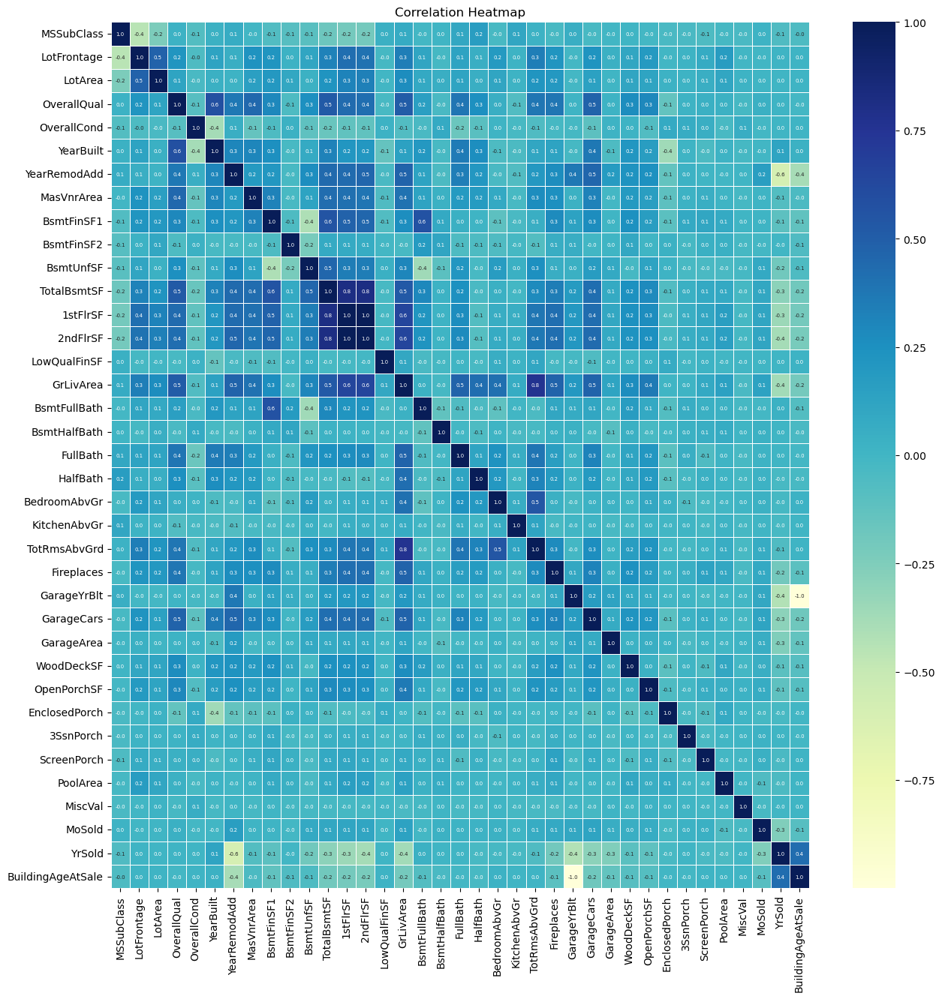

In [48]:
def correlation_map(df):
  # Select only numeric columns from the DataFrame for correlation analysis
  numeric_df = df.select_dtypes(include=['number'])

  # Compute the correlation matrix for the numeric columns
  correlation_matrix = numeric_df.corr()

  # Create a heatmap to visualize the correlation matrix
  plt.figure(figsize=(15, 15))  # Set the figure size

  # Plot the heatmap with annotations and a color map for better visualization
  sns.heatmap(correlation_matrix,
              annot=True,  # Show correlation values on the heatmap
              fmt=".1f",  # Format numbers to two decimal places
              annot_kws={"size": 5},  # Set font size for the annotations (smaller size)
              cmap='YlGnBu',  # Use a yellow-green-blue color map
              xticklabels=correlation_matrix.columns,  # Label the x-axis with column names
              yticklabels=correlation_matrix.columns,  # Label the y-axis with column names
              linewidths=0.5)  # Add line widths between cells for better separation

  # Set the title of the heatmap
  plt.title('Correlation Heatmap')

  # Display the heatmap
  plt.show()

correlation_map(df_train_all_data)

#### correlation matrix based func
We made a generic function that drops the features with a correlation greater than a pre-defined parameter that will be found in the preprocess optimization part.
From a quick look we can clearly see that the problem had been addressed. The matrix in Figure 5 contained cells with dark color (e.g. the cells that combines: 1stFlrSF, 2stFlrSF and TotalBsmtSF).We can also find a logic in this example because all of those features representing the condition of the basement in the house and they are all heavily linked.

In [50]:
def get_columns_with_high_correlation(df, cutoff):
    """
    Identifies and returns columns to drop based on the correlation cut-off.

    Parameters:
        df (pd.DataFrame): The input DataFrame containing the data.
        cutoff (float): The correlation cut-off value (e.g., 0.9 for 90%).

    Returns:
        set: A set of column names to drop.
    """
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=['number'])

    # Compute the correlation matrix
    correlation_matrix = numeric_df.corr().abs()

    # Upper triangle of the correlation matrix to avoid duplicate checks
    upper_triangle = correlation_matrix.where(
        np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
    )

    # Identify columns to drop based on the cut-off
    columns_to_drop = {
        column for column in upper_triangle.columns
        if any(upper_triangle[column] > cutoff)
    }

    return columns_to_drop

### 8.	Training And Hyperparameter Optimization:
This section will be presented under the “Pre-Process” section. It contains a preprocess_data(kwargs) function that is doing the preprocess given a certain parameters combination, the params in this function are all the params we discussed so far for this specific dataset. It will be used later inside an optimization of a specific model with the assumptions that different models can be better off using different preprocess parameters to yield better results as well as different hyper parameter of a certain model (xg-boot) can be better off with different preprocess parameters. Afterwards we selected to focus on the xg-boost model and for this model under the “XGB Basic Model - Grid Search on Our Params” section we implemented the function “auto_tune_preprocessing ()” that does the grid search and outputs the best params and a csv containing prints of the best params attempts that the function has found. This csv will be attached in the final zip submission.
In addition to our focus on the xg-boost model we did a training process on another two model as we were asked for in the question. We chose Random Forrest and Lasso Regression, In addition the section contains another “K-Fold” section with the results of K-Fold CE that we did for each one of the models.


#### preprocess_data Function:
The preprocess_data function automates all data processing steps based on the selected parameters to ensure clean, well-prepared, and optimized data for the model.

In [53]:
X_train_to_process, X_val_to_process, y_train_to_process, y_val_to_process = x_train_df, x_val_df, y_train_df, y_val_df
def preprocess_data(
    df_train,
    df_val,
    df_train_y,
    missing_values_cut_off=30.0,
    correlation_cutoff=0.9,
    too_dense_cutoff=0.99,
    missing_data_imputation_method_category='mode',
    imputation_method = 'median',
    missing_imputation_k=5,
    outlier_method='iqr',
    z_thresh=3.0,
    iqr_param=1.5,
    lof_n_neighbors=20,
    lof_contamination=0.05,
    drop_missing=True,
    drop_correlation=True,
    drop_too_dense=True,
    handle_missing=True,
    handle_outliers=True,
    fix_categories=True,
    do_transformation = False,
    features_transformation = None,
    features_to_drop= [],
    to_marge = True,
    marge_threshold = 0.05
):
    """
    Preprocesses the dataset with the following steps:
        Step 1: Drop columns with high missing values
        Step 2: Drop columns with no added information
        Step 3: Handle missing data
        Step 4: Handle outliers
        step 5: fixing typos in the cetegories of categorical coloumns
        step 6: catgories to drop
        step 7: marge catgories
        step 8: transformation:
        Step 9: Drop columns with high correlation

    Parameters:
        df_train (pd.DataFrame): The train input DataFrame.
        df_val (pd.DataFrame): The validation input DataFrame.
        df_train_pred (pd.DataFrame): The train output DataFrame.
        missing_values_cut_off (float): Percentage cutoff to drop columns with high missing values.
        correlation_cutoff (float): Correlation cutoff to drop highly correlated columns.
        too_dense_cutoff (float): percentage cutoff to drop if coulomns with dominant category.
        imputation_method  (str): Imputation method for numerical data ('knn' or 'median' or 'mice'). Defualt = median
        missing_data_imputation_method_category (str): Imputation method for categoric data ('knn' or 'mode'). Defualt = mode
        missing_imputation_k (int): Number of neighbors for KNN Imputation (if method='knn').
        outlier_method (str): Method to handle outliers ('iqr', 'zscore', or 'lof').
        z_thresh (float): Z-score threshold for outlier detection (if method='zscore').
        iqr_param (float): IQR multiplier for outlier detection (if method='iqr').
        lof_n_neighbors (int): Number of neighbors for LOF (if method='lof').
        lof_contamination (float): Contamination level for LOF (if method='lof').
        drop_missing (bool): Whether to drop columns with high missing values.
        drop_correlation (bool): Whether to drop highly correlated columns.
        drop_too_dense (bool): Whether to drop columns with high dominant categories.
        handle_missing (bool): Whether to handle missing data.
        handle_outliers (bool): Whether to handle outliers.
        do_transformation (bool): if to do transformation
        features_transformation(dict) : for each feature (key) which transformation to do value can get only ('BEST','Z_SCORE','LOG','MIN_MAX')
        features_to_drop(list): list of features names that we want to drop
        to_marge(bool) :  true if to do marge to small categories , false if not to marge
        marge_threshold(float): the treshold to marge - the minimum precent in cat

    Returns:
        pd.DataFrame: The preprocessed DataFrame.
    """
    if df_train is None or df_val is None:
        raise ValueError("Input DataFrames cannot be None.")

    df_to_process = [df_train, df_val]
    df_y = df_train_y
    df_to_return = []

    for i, df in enumerate(df_to_process):
        replace_ordinal_to_numerical(df)
    
        if(i == 0):
            cols_to_drop_missing_values = get_columns_with_missing_values(df_train, missing_values_cut_off)
            cols_to_drop_high_correl = get_columns_with_high_correlation(df_train, correlation_cutoff)
            cols_to_drop_too_dominant = get_highly_dominant_categorical_columns(df_train, too_dense_cutoff)
            cols_to_drop_to_dominant_num = get_highly_dominant_numerical_columns(df_train, too_dense_cutoff)
            small_categories_dict = find_small_categories_for_all_features(df_train, marge_threshold)
            
            if do_transformation:
                features_transformation = {key: value for key, value in features_transformation.items() if key in df.columns}
                for feature, transformation in features_transformation.items():
                    if pd.api.types.is_numeric_dtype(df[feature]):
                        if transformation == 'BEST':
                            new_transformation = suggest_transformation(df, feature)
                            features_transformation[feature] = new_transformation 
                    
        # Step 1: Drop columns with high missing values
        if drop_missing:
            df = df.drop(columns=[col for col in cols_to_drop_missing_values if col in df.columns])
        
        # Step 2: Drop columns with no added information
        if drop_too_dense:
            df = df.drop(columns=[col for col in cols_to_drop_too_dominant if col in df.columns])
            df = df.drop(columns=[col for col in cols_to_drop_to_dominant_num if col in df.columns])
        
        # Step 3: Handle missing data
        if handle_missing:
            df = replace_ilegal_data_YrSold_and_GarageYrBlt_and_negative_with_nan(df)
            df = repalce_unlogical_combination_of_years_to_nan(df)
            df = handle_missing_data(df, imputation_method , missing_data_imputation_method_category , k= missing_imputation_k, use_mice_for_numerical= (imputation_method == 'mice'))
        
        # Step 4: Handle outliers
        if handle_outliers:
            # Replacing Outliars
            df = handle_outliers_in_data(
                df,
                method=outlier_method,
                z_thresh=z_thresh,
                iqr_param=iqr_param,
                n_neighbors=lof_n_neighbors,
                contamination=lof_contamination
            )
            # After the outliers got replaced by NaN's, handle them again. 
            if handle_missing:
                df = handle_missing_data(df, imputation_method , missing_data_imputation_method_category , k= missing_imputation_k, use_mice_for_numerical= (imputation_method == 'mice'))

        # step 5: fixing typos in the cetegories of categorical coloumns
        if fix_categories:
            df = unify_categorical_case(df)
        
         # step 6: catgories to drop
        df = df.drop(features_to_drop, axis=1)

        # step 7: marge catgories
        if to_marge:
            df = merge_small_categories_for_all_features(df, small_categories_dict)
        
        # step 8: transformation:
        if do_transformation:
            features_transformation = {key: value for key, value in features_transformation.items() if key in df.columns}
            for feature, transformation in features_transformation.items():
                if pd.api.types.is_numeric_dtype(df[feature]):
                    df = apply_transformation(df, feature, transformation)
            
        # Step 9: Drop columns with high correlation
        if drop_correlation:
            df = df.drop(columns=[col for col in cols_to_drop_high_correl if col in df.columns])
        
        df = df.fillna(0)  
        df_to_return.append(df)
        
    return df_to_return[0], df_to_return[1], df_y


Run an initial preprocessing function to evaluate the different models. - Call the result data set initial preprocessed data

In [55]:
# Preprocess data-set
X_train, X_val, y_train = preprocess_data(
    X_train_to_process.copy(),
    X_val_to_process.copy(),
    y_train_to_process.copy(),
    missing_values_cut_off=75.0,
    too_dense_cutoff=0.99,
    missing_data_imputation_method_category='knn',
    imputation_method = "mice",
    missing_imputation_k = 10,
    correlation_cutoff=0.75,
    outlier_method='zscore',
    do_transformation = True,
    features_transformation = {feature: 'BEST' for feature in X_train_to_process.columns},
    features_to_drop = ['Neighborhood','Exterior1st','Exterior2nd'],
    to_marge = True,
    marge_threshold = 0.05 
)
y_val = y_val_to_process

#### Models

##### Helper Functions

In [58]:
# Create a custom wrapper class for XGBRegressor
class XGBRegressorWrapper(BaseEstimator, TransformerMixin):
    def __init__(self, **kwargs):
        self.kwargs = kwargs
        self.regressor = None

    def fit(self, X, y):
        self.regressor = XGBRegressor(**self.kwargs)
        self.regressor.fit(X, y)
        return self

    def transform(self, X):
        if self.regressor is None:
            raise ValueError("Model has not been fitted yet.")
        return self.regressor.predict(X).reshape(-1, 1)  # Reshape to a column vector

    def predict(self, X):
        if self.regressor is None:
            raise ValueError("Model has not been fitted yet.")
        return self.regressor.predict(X)
    def get_booster(self):
        """Expose the internal XGBoost booster for SHAP compatibility."""
        return self.regressor.get_booster()
    def get_regressor(self):
        return self.regressor

In [59]:
# help function that calculates MAE
def calc_mae(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    print(f"Mean Absolute Error (MAE): {mae:,.2f}")
    return mae

This function was created to save the results in a CSV file, ensuring that all the best possible options are recorded. This allows us to resume runs if they were interrupted, reduces memory usage by avoiding excessive printing to the screen, and makes it easier to compare results to achieve the best MAE.

In [61]:
# keep resualt to csv
def append_row_to_csv(filename, row, row2, score):
    """
    Function to append a row to a CSV file.
    
    Parameters:
    filename (str): The name of the file.
    row (dict): A dictionary representing the parameters.
    score (float): The model score.
    """
    try:
        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)
            # Convert dictionary to a readable format
            row_str = ", ".join(f"{key}={value}" for key, value in row.items())
            row_str2 = ", ".join(f"{key}={value}" for key, value in row2.items())
            writer.writerow([row_str,row_str2, score])  # Writing as a proper row
    except Exception as e:
        print(f"An error occurred while appending the row to the file: {e}")

##### Lasso Regression
Lasso Regression is a linear model with L1 regularization, which helps in feature selection by shrinking some coefficients to zero. It reduces overfitting by penalizing large coefficients, making the model simpler and improving generalization. The strength of regularization is controlled by α, where higher values lead to fewer active features

The evaluate_Lasso_model function builds and evaluates a Lasso regression model using a preprocessing pipeline. It first identifies categorical and numerical features, then applies one-hot encoding to categorical features while keeping numerical features unchanged. The data is processed using a ColumnTransformer, followed by training a Lasso regression model (alpha=0.1), which applies L1 regularization to reduce overfitting. The function fits the model on the training data and returns predictions for the validation set, ensuring efficient handling of mixed data types and automatic feature transformation

In [64]:
def evaluate_Lasso_model(xt, xv, yt):
    # Create a ColumnTransformer to apply OneHotEncoder to categorical features
    categorical_features = xt.select_dtypes(include=['object']).columns
    numerical_features = xt.select_dtypes(exclude=['object']).columns
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', numerical_features),  # Keep numerical features as they are
            ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_features)  # One-hot encode categorical features
        ])
    
    # Create a pipeline with the preprocessor and the Linear Regression model
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', Lasso(alpha=0.1))
    ])
    
    # Fit the pipeline to the training data
    pipeline.fit(xt, yt)
    
    # Make predictions on the validation set
    y_val_pred = pipeline.predict(xv)
    
    return y_val_pred

In [65]:
# run Lasso Rigression on -initial preprocessed data
calc_mae(y_val, evaluate_Lasso_model(X_train, X_val, y_train))

Mean Absolute Error (MAE): 81,142.40


81142.39833359378

##### Random Forest
Random Forest is an ensemble learning algorithm that builds multiple decision trees and combines their predictions to improve accuracy and reduce overfitting. Each tree is trained on a random subset of the data using bootstrap sampling and selects a random subset of features at each split, making the model more robust. The final prediction is obtained by averaging the outputs of all trees (for regression) or taking a majority vote (for classification).

The evaluate_rf_model function builds and evaluates a Random Forest Regressor using a pipeline that automates preprocessing, hyperparameter tuning, and model training. It first applies one-hot encoding to categorical features while keeping numerical features unchanged. Then, it performs grid search with cross-validation to find the best hyperparameters for the model, optimizing based on negative mean absolute error (MAE). The pipeline is trained on the given dataset and used to predict target values for the validation set, ensuring efficient feature handling and model optimization

In [68]:
def evaluate_rf_model(xt, xv, yt):
    # Initialize the RandomForestRegressor
    clf = RandomForestRegressor()

    # Define the parameter grid to search over
    grid_values = {
        'n_estimators': [50, 100, 200],        # Number of trees in the forest
        'max_depth': [None, 10, 20],           # Maximum depth of each tree (None = no limit)
        'min_samples_split': [2, 5, 10],       # Minimum samples required to split a node
        'min_samples_leaf': [1, 2, 4],         # Minimum samples required at a leaf node
        'max_features': ['sqrt', 'log2', None],# Number of features to consider per split
        'bootstrap': [True, False]             # Whether to use bootstrapped samples
    }

    # Initialize GridSearchCV to perform an exhaustive search over the specified parameter grid
    # Using 3-fold cross-validation and evaluating performance using the negative mean squared error
    GS_RF = GridSearchCV(clf, param_grid=grid_values, cv=3, scoring='neg_mean_absolute_error')

    # Create a ColumnTransformer to apply OneHotEncoder to categorical features
    categorical_features = xt.select_dtypes(include=['object']).columns
    numerical_features = xt.select_dtypes(include=['number']).columns

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', numerical_features),  # Keep numerical features as they are
            ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_features)  # One-hot encode categorical features
        ])

    # Create a pipeline with the preprocessor and the RandomForestRegressor
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', GS_RF)
    ])

    # Fit the pipeline to the training data
    pipeline.fit(xt, yt)
    # Evaluate on the validation data
    y_val_pred = pipeline.predict(xv)
    return y_val_pred

In [69]:
# run random forest on -initial preprocessed data
calc_mae(y_val, evaluate_rf_model(X_train, X_val, y_train))

Mean Absolute Error (MAE): 65,708.23


65708.22646165262

##### XGB
XGBoost (Extreme Gradient Boosting) is a powerful machine learning algorithm based on gradient boosting, optimized for speed and performance. It builds decision trees sequentially, where each new tree corrects the errors of the previous ones, improving accuracy while preventing overfitting using techniques like regularization (L1 & L2), shrinkage, and subsampling. Due to its efficiency and scalability, XGBoost is widely used in structured data tasks, competitions, and real-world applications.

In [71]:
#same function but this one is also returning the model. used only on test becouse XAI need the model.
def evaluate_xgb_model_return_model(xt, xv, yt, xgb_params=None):
    # Identify categorical and numerical features
    categorical_features = xt.select_dtypes(include=['object']).columns
    numerical_features = xt.select_dtypes(exclude=['object']).columns
    
    # Define preprocessing steps
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', numerical_features),
            ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_features)
        ]
    )

    if xgb_params is not None:
        # Create an XGBoost model with specified hyperparameters
        xgb_model = XGBRegressorWrapper(**xgb_params)
    else: 
        xgb_model = XGBRegressorWrapper()
    
    # Create a pipeline
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', xgb_model)
    ])
    
    # Fit the pipeline to the training data
    pipeline.fit(xt, yt)
    
    # Make predictions on the validation set
    y_val_pred = pipeline.predict(xv)

     # Transform xt and xv using the fitted preprocessor
    xt_encoded = pipeline.named_steps['preprocessor'].transform(xt)
    xv_encoded = pipeline.named_steps['preprocessor'].transform(xv)

    # Get feature names after encoding
    encoded_feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()

    # Convert transformed numpy arrays back to DataFrames
    xt_encoded = pd.DataFrame(xt_encoded, columns=encoded_feature_names, index=xt.index)
    xv_encoded = pd.DataFrame(xv_encoded, columns=encoded_feature_names, index=xv.index)
    
    return y_val_pred , pipeline.named_steps['regressor'].get_regressor(), xt_encoded, xv_encoded

In [72]:
def evaluate_xgb_model(xt, xv, yt, xgb_params=None):
    # Identify categorical and numerical features
    categorical_features = xt.select_dtypes(include=['object']).columns
    numerical_features = xt.select_dtypes(exclude=['object']).columns
    
    # Define preprocessing steps
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', numerical_features),
            ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_features)
        ]
    )

    if xgb_params is not None:
        # Create an XGBoost model with specified hyperparameters
        xgb_model = XGBRegressorWrapper(**xgb_params)
    else: 
        xgb_model = XGBRegressorWrapper()
    
    # Create a pipeline
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', xgb_model)
    ])
    
    # Fit the pipeline to the training data
    pipeline.fit(xt, yt)
    
    # Make predictions on the validation set
    y_val_pred = pipeline.predict(xv)
    
    return y_val_pred

###### Grid Search On Our Params 

The to_grid_xgboost function builds and optimizes an XGBoost Regressor using GridSearchCV to find the best hyperparameters while handling categorical and numerical features through preprocessing. It applies one-hot encoding to categorical data, performs grid search with cross-validation to tune parameters like max_depth, learning_rate, and subsample, and evaluates performance using Mean Absolute Error (MAE). The function returns the best hyperparameters and MAE, streamlining the process of training a well-optimized XGBoost model.

In [75]:
def to_grid_xgboost(X_train, X_val, y_train, y_val):
    # Initialize the XGBoost Regressor
    clf = xgb.XGBRegressor(objective='reg:squarederror', eval_metric='rmse', random_state=42)

    # Define the parameter grid for GridSearchCV
    grid_values= {
        'n_estimators': [200],        # Number of boosting rounds (trees)
        'max_depth': [3, 5, 7],                # Maximum depth of each tree
        'learning_rate': [0.05, 0.1],    # Step size shrinkage (lower values prevent overfitting)
        'subsample': [0.4, 0.6, 0.8],          # Fraction of samples used per boosting round
        'colsample_bytree': [0.4, 0.6, 0.8],   # Fraction of features used per tree
        'reg_alpha': [0],              # L1 regularization (encourages sparsity)
        'reg_lambda': [1]              # L2 regularization (controls complexity)
    }

    # Initialize GridSearchCV
    GS_XGB = GridSearchCV(clf, param_grid=grid_values, cv=3, scoring='neg_mean_absolute_error', verbose=1)

    # Create a ColumnTransformer to apply OneHotEncoder to categorical features
    categorical_features = X_train.select_dtypes(include=['object']).columns
    numerical_features = X_train.select_dtypes(include=['number']).columns

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', 'passthrough', numerical_features),  # Keep numerical features as they are
            ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_features)  # One-hot encode categorical features
        ])

    # Create a pipeline with the preprocessor and the XGBoost model
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', GS_XGB)
    ])

    # Fit the pipeline to the training data
    pipeline.fit(X_train, y_train)
    best_params = GS_XGB.best_params_

    # Evaluate on the validation data
    y_val_pred = pipeline.predict(X_val)
    mae = calc_mae(y_val, y_val_pred)
    
    return mae, best_params

In [76]:
# run XGB on -initial preprocessed data
mae , _ = to_grid_xgboost(X_train, X_val, y_train, y_val)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Mean Absolute Error (MAE): 64,855.10


##### Auto Tune PreProcessing

We chose XGBoost for hyperparameter tuning due to its lowest Mean Absolute Error (MAE) of 64,855.10, outperforming Lasso Regression (MAE = 81,142.40) and Random Forest (MAE = 67,605.98). This focus on XGBoost allows for optimizing performance further, capitalizing on its strengths in handling complex data patterns.

The Params Search - Auto Tune Preprocessing function systematically optimizes preprocessing parameters using a grid search approach. It starts by training and evaluating a base XGBoost model with the initial set of hyperparameters. The mean absolute error (MAE) of this model is recorded. If the MAE score of the base model is the best so far(from base models), the function proceeds to optimize further- the function fine-tunes the model by performing an inner grid search for XGBoost hyperparameters. Additionally, it uses k-fold cross-validation to ensure robustness. The optimal preprocessing and model settings, along with the corresponding MAE score, are logged into a text file (xgboost_HyperParams_search.txt in the Q1 folder).


In [179]:
def auto_tune_preprocessing(
    x_t,
    x_v,
    y_t,
    y_v,
    param_grid):
    """
    Automatically tunes preprocessing parameters using a grid search approach.
    
    Parameters:
        x_train_df, x_val_df, y_train_df, y_val_df: DataFrames
            Training and validation data.
        model: scikit-learn compatible model
            Model used for evaluation.
        param_grid: dict
            Dictionary containing preprocessing hyperparameters to tune.
    
    Returns:
        dict: Best hyperparameter combination based on scoring function.
    """
    param_keys = list(param_grid.keys())
    param_values = list(param_grid.values())
    best_score = 1_000_000_000
    best_params = None
    
    for i, param_combination in enumerate(product(*param_values)):
        if i % 100 == 0:
            print(f'Run number {i}')
        params = dict(zip(param_keys, param_combination))
        
        X_train_to_process, X_val_to_process, y_train_to_process, y_val = x_t.copy(), x_v.copy(), y_t.copy(), y_v.copy()
        try:
            # Preprocess data with current parameter combination
            X_train, X_val, y_train = preprocess_data(
                X_train_to_process,
                X_val_to_process,
                y_train_to_process,
                **params
            )
            
            # Train and evaluate model
            score = calc_mae(y_val, evaluate_xgb_model(X_train, X_val, y_train))

            # Track best parameters
            if score < best_score:
                best_score = score
                best_params = params
                best_score_for_inner_grid = 1_000_000_000
                best_inner_params = None
                inner_grid_score , inner_params= to_grid_xgboost(X_train, X_val, y_train,y_val)
                if inner_grid_score < best_score_for_inner_grid:
                    best_score_for_inner_grid = inner_grid_score
                    best_inner_params = inner_params
                append_row_to_csv('xgboost_HyperParams_search4.txt', best_params, best_inner_params ,best_score_for_inner_grid)
                    
        except Exception as e:
                continue
    
    print("Best Params:", best_params)
    print("Best Score:", best_score)
    
    return best_params

X_train_to_process, X_val_to_process, y_train_to_process, y_val_to_process = x_train_df.copy(), x_val_df.copy(), y_train_df.copy(), y_val_df.copy()


# The params to search - there was more but we deleted it
param_grid = {
    "missing_values_cut_off": [40, 50.0 , 60.0 , 70.0],  # Drop columns with more than X% missing values
    "correlation_cutoff": [0.6, 0.70, 0.80],  # Threshold to drop highly correlated columns
    "too_dense_cutoff": [0.6,0.7, 0.8] , # Drop columns with dominant categories
    "imputation_method": ["median", "knn", "mice"],  # Strategies for numerical imputation
    "missing_data_imputation_method_category": ["mode", "knn"],  # Categorical imputation
    "missing_imputation_k": [5],  # KNN imputation neighbors
    "outlier_method": ["iqr", "zscore", "lof"],  # Outlier detection methods
    "z_thresh": [ 3.0, 3.5 ,4 ],  # Z-score threshold for outlier detection
    "iqr_param": [2.5, 3],  # IQR multiplier for outlier detection
    "lof_n_neighbors": [10, 20, 30],  # LOF neighbors for outlier detection
    "lof_contamination": [0.1 , 0.5 , 1],  # LOF contamination rate
    #"drop_missing": [True, False],  # Whether to drop high-missing columns
    #"drop_correlation": [True, False],  # Whether to drop highly correlated columns
    #"drop_too_dense": [True, False],  # Whether to drop too-dense categorical columns
    "handle_missing": [True, False],  # Whether to impute missing values
    "handle_outliers": [True, False],  # Whether to handle outliers
    "do_transformation": [True, False],  # Whether to apply transformations
    "features_transformation": [
         {feature: "BEST" for feature in X_train_to_process.columns},  
         {feature: "Z_SCORE" for feature in X_train_to_process.columns},
         {feature: "LOG" for feature in X_train_to_process.columns}
     ] , # Feature transformation strategies
    "features_to_drop": [['Neighborhood','Exterior1st','Exterior2nd'] ,[]],
    "to_marge" : [False,True],
    "marge_threshold": [0.05,0.1]
}
auto_tune_preprocessing(X_train_to_process, X_val_to_process, y_train_to_process, y_val_to_process, param_grid)

Run number 0
Mean Absolute Error (MAE): 79,918.07
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Mean Absolute Error (MAE): 73,059.91
 RMSE: 119650.2898
Mean Absolute Error (MAE): 79,918.07
Mean Absolute Error (MAE): 76,919.77
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Mean Absolute Error (MAE): 67,774.35
 RMSE: 114270.5225
Mean Absolute Error (MAE): 80,402.00
Mean Absolute Error (MAE): 78,685.36
Mean Absolute Error (MAE): 78,685.36
Mean Absolute Error (MAE): 76,545.71
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Mean Absolute Error (MAE): 68,234.52
 RMSE: 112626.5762
Mean Absolute Error (MAE): 75,378.08
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Mean Absolute Error (MAE): 70,158.44
 RMSE: 115088.4613
Mean Absolute Error (MAE): 63,472.62
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Mean Absolute Error (MAE): 60,139.27
 RMSE: 99938.6553
Mean Absolute Error (MAE): 63,472.62
Mean Absolute Error (MAE): 6

{'missing_values_cut_off': 70.0,
 'correlation_cutoff': 0.7,
 'too_dense_cutoff': 0.8,
 'imputation_method': 'mice',
 'missing_data_imputation_method_category': 'knn',
 'missing_imputation_k': 5,
 'outlier_method': 'iqr',
 'iqr_param': 2.5,
 'handle_missing': True,
 'handle_outliers': True,
 'do_transformation': True,
 'features_transformation': {'MSSubClass': 'LOG',
  'MSZoning': 'LOG',
  'LotFrontage': 'LOG',
  'LotArea': 'LOG',
  'Street': 'LOG',
  'Alley': 'LOG',
  'LotShape': 'LOG',
  'LandContour': 'LOG',
  'Utilities': 'LOG',
  'LotConfig': 'LOG',
  'LandSlope': 'LOG',
  'Neighborhood': 'LOG',
  'Condition1': 'LOG',
  'Condition2': 'LOG',
  'BldgType': 'LOG',
  'HouseStyle': 'LOG',
  'OverallQual': 'LOG',
  'OverallCond': 'LOG',
  'YearBuilt': 'LOG',
  'YearRemodAdd': 'LOG',
  'RoofStyle': 'LOG',
  'RoofMatl': 'LOG',
  'Exterior1st': 'LOG',
  'Exterior2nd': 'LOG',
  'MasVnrType': 'LOG',
  'MasVnrArea': 'LOG',
  'ExterQual': 'LOG',
  'ExterCond': 'LOG',
  'Foundation': 'LOG',
  '

### 9. Inference 6.	Final Data Exploration: 

**Best Practices for Preprocessing**

Based on an analysis of the best preprocessing techniques, the following steps were determined because they achieved the minimum MAE on the validation dataset:
- **Feature Removal:**
  - Features with more than **60% missing values** should be removed.
  - Features with a correlation **greater than 0.7** should be filtered, keeping only one of them.
  - Features with a **single dominant value exceeding 80%** should be removed.

- **Missing Value Imputation:**
  - Missing values are imputed using the **MICE** algorithm.
  - Missing values in categorical features are imputed using **KNN** with **K=5**.

- **Outlier Detection:**
  - Outliers are identified using the **IQR** method with a threshold of **2.5**.

- **Feature Grouping:**
  - Values within categorical features were merged when their proportion was **less than 5%** of the total dataset.

- **Feature Transformation:**
  - Features were transformed using the **log transformation**.

In [84]:
# Preprocess data-set
df_train_all_to_process, df_test_to_process, y_train_all_to_process =  df_train_all_data.copy(), df_test.copy(), y_train_all_data.copy()
xt, xv, yt = preprocess_data(
    df_train_all_to_process,
    df_test_to_process, 
    y_train_all_to_process, 
    missing_values_cut_off=60.0, 
    correlation_cutoff=0.7,
    too_dense_cutoff=0.8,
    imputation_method='mice', 
    missing_data_imputation_method_category='knn',
    missing_imputation_k=5,
    outlier_method='iqr', 
    iqr_param=2.5,
    handle_missing=True,
    handle_outliers=True, 
    do_transformation=True,
    features_transformation = {feature: 'LOG' for feature in X_train_to_process.columns},
    features_to_drop= [],
    to_marge=True, 
    marge_threshold=0.05
)

#### Visualize after pre process

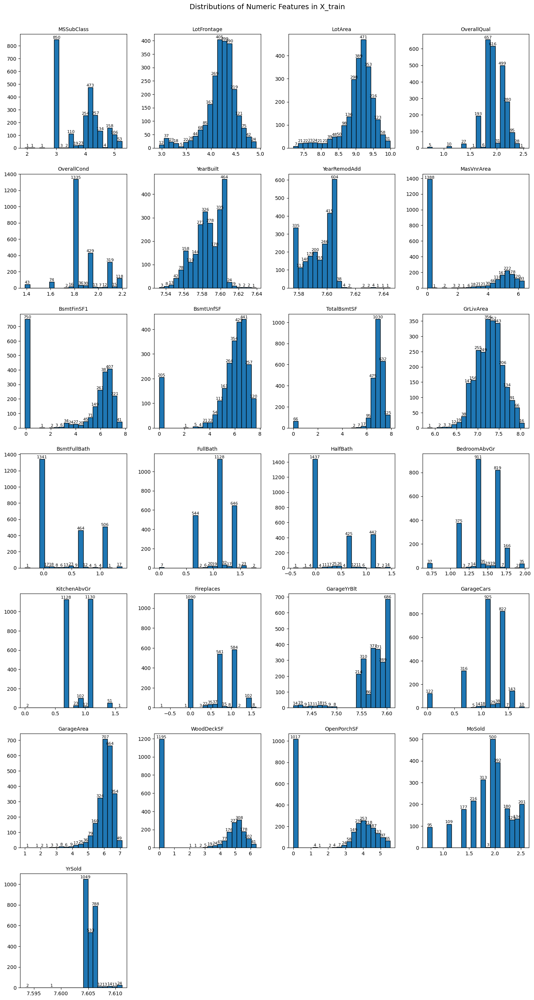

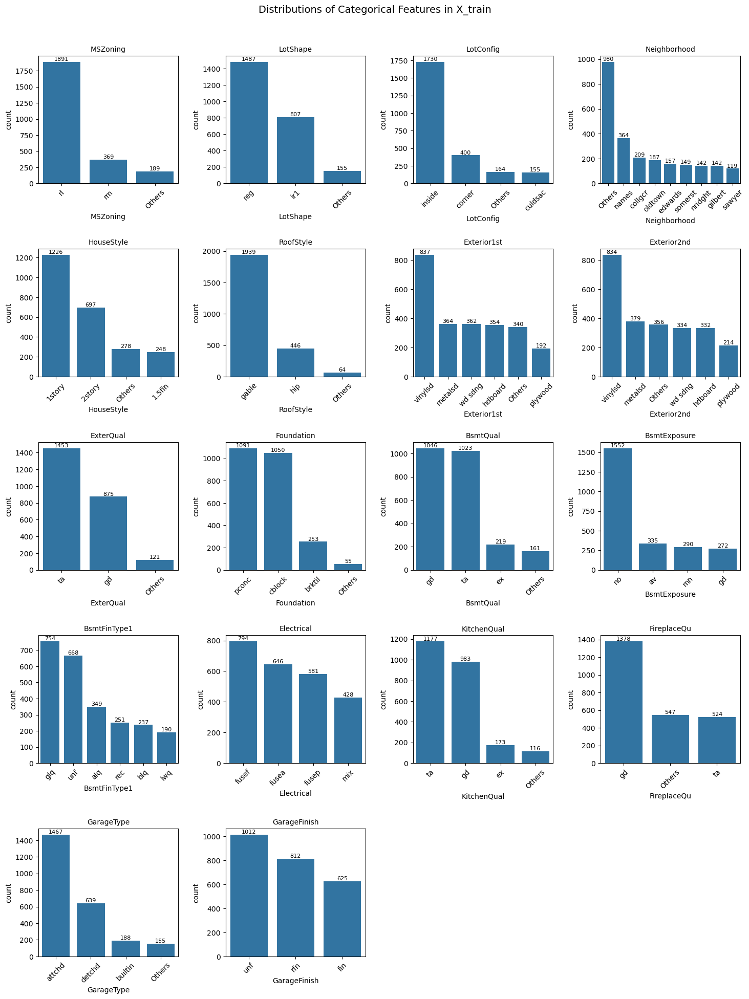

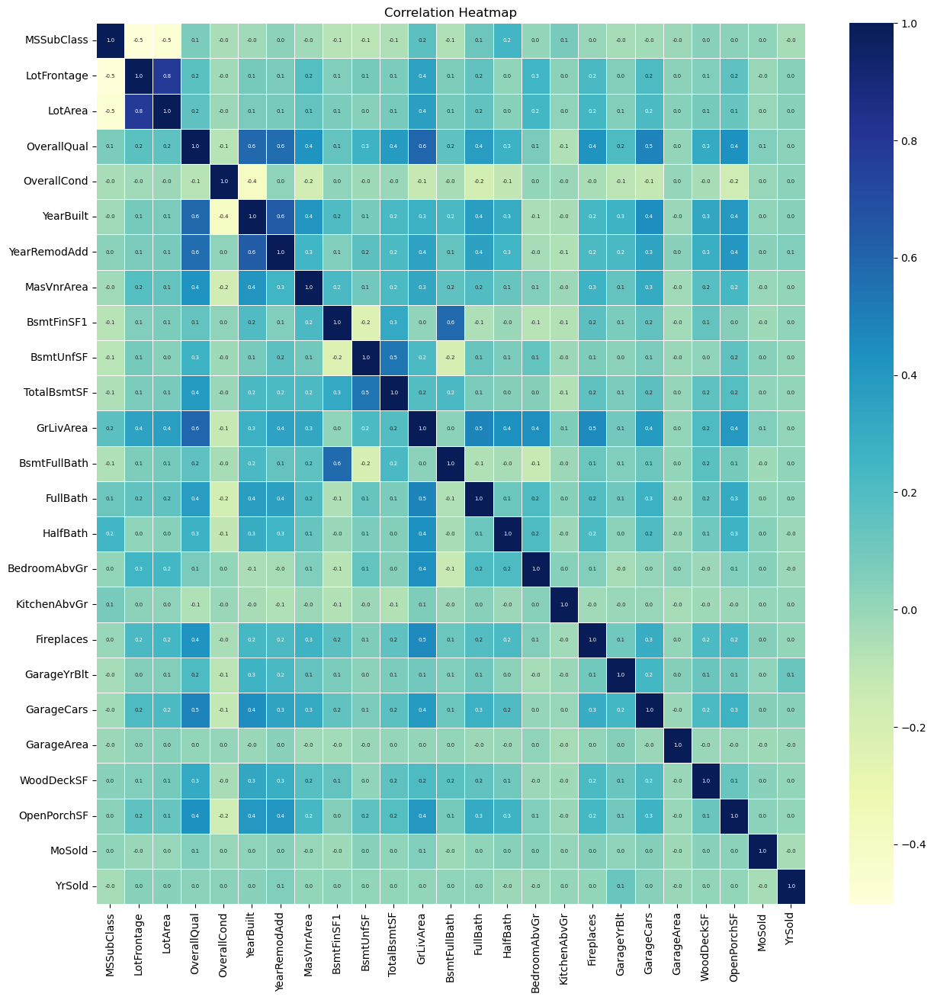

In [86]:
display_stats_and_visuals(xt, "X_train")
correlation_map(xt)

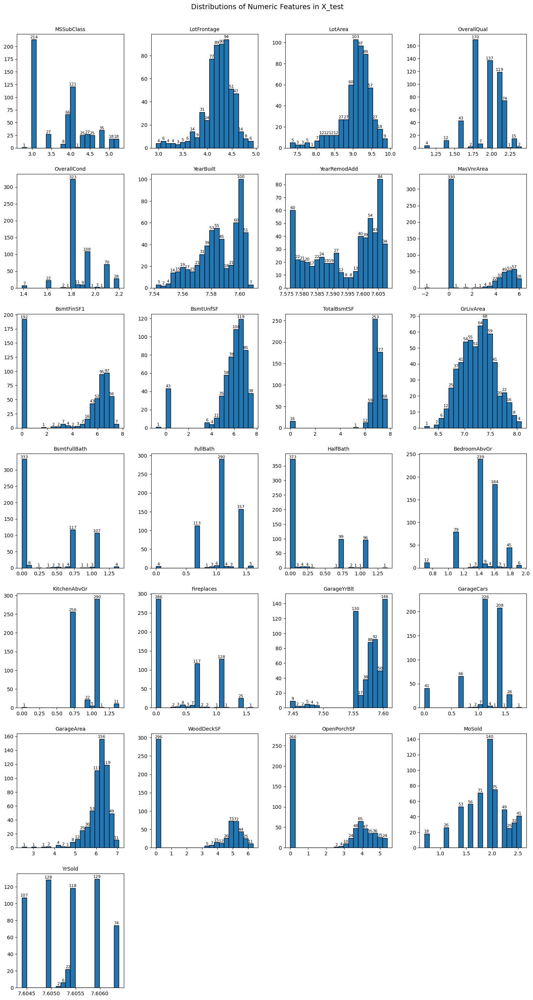

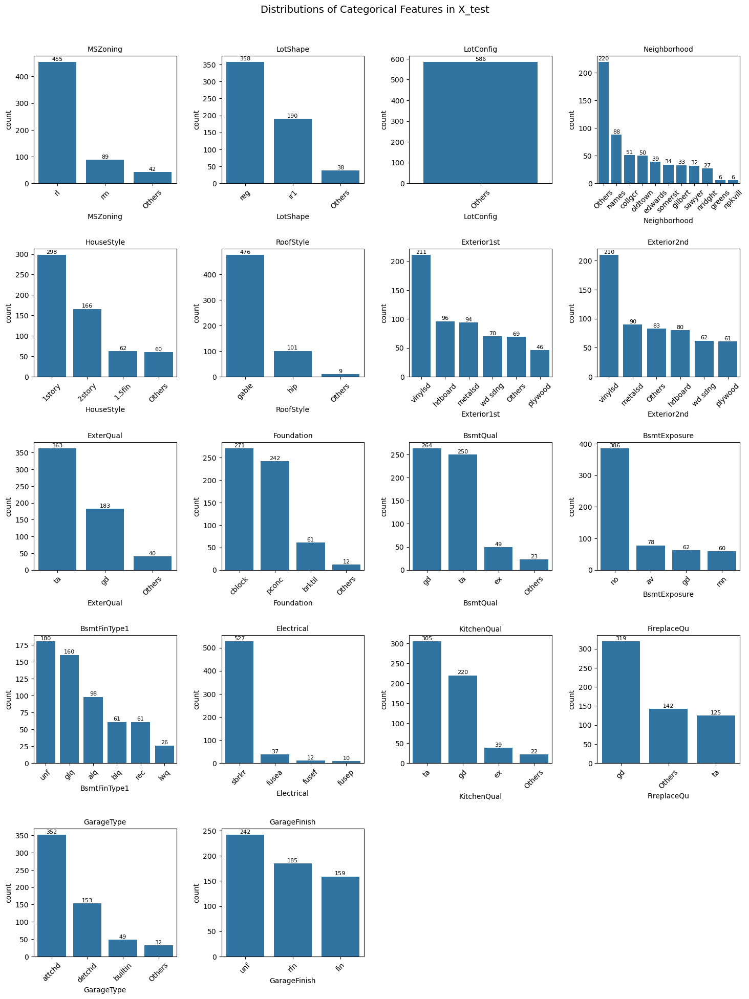

In [87]:
display_stats_and_visuals(xv, "X_test")

 for example, e, the distribution of the numerical features looks slightly different and few of the feature’s histograms are missing because they were being removed from various reasons such as too much missing data or high correlation to other features.

We can clearly see that the problems that mentioned before had been addressed.
- there are no features with the same category with both upper and lower cas
- We found that few of the categorical features had big cardinality (e.g. Neighborhood).
- We found that some of features have a predominant single value (e.g PoolArea) and RoofMatl has only one category.
- We observed various distributions across different variables, some with long tails and others resembling a normal distribution and others with other   distribution.
- We found that years features that is more then 2025 (e.g. yearBulit)
- We found there are several features that contains values that there frequency in vary low (e.g. houseStyle: 2.5Fin, 1.5Unf, 2.5Unf).

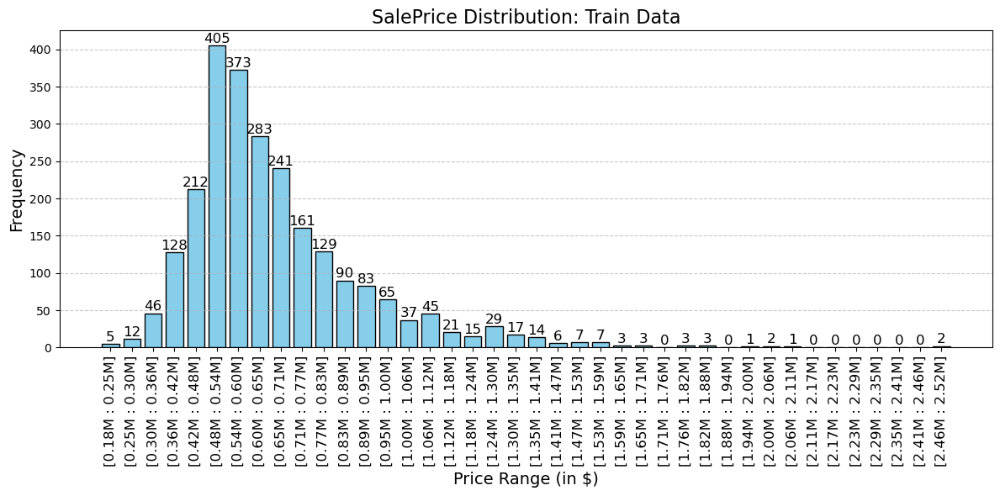

In [89]:
#Y train visualize
visualize_saleprice_distribution(yt, "Train Data")

Defines the best hyperparameters for an XGBoost model and evaluates it using a custom function and predict the test dataset.

In [91]:
#Best hyperparams for our model
best_xg_params_values= {
        'n_estimators':200,        # Number of boosting rounds (trees)
        'max_depth': 7,                # Maximum depth of each tree
        'learning_rate': 0.05,    # Step size shrinkage (lower values prevent overfitting)
        'subsample': 0.6,          # Fraction of samples used per boosting round
        'colsample_bytree': 0.8,   # Fraction of features used per tree
        'reg_alpha': 0,              # L1 regularization (encourages sparsity)
        'reg_lambda': 1             # L2 regularization (controls complexity)
    }

#evalute the best model and predict for test
y_pred , model, xt, xv= evaluate_xgb_model_return_model(xt, xv, yt, best_xg_params_values)
#ndarray to df
df_y_pred = pd.DataFrame(y_pred, columns=['SalePrice'])

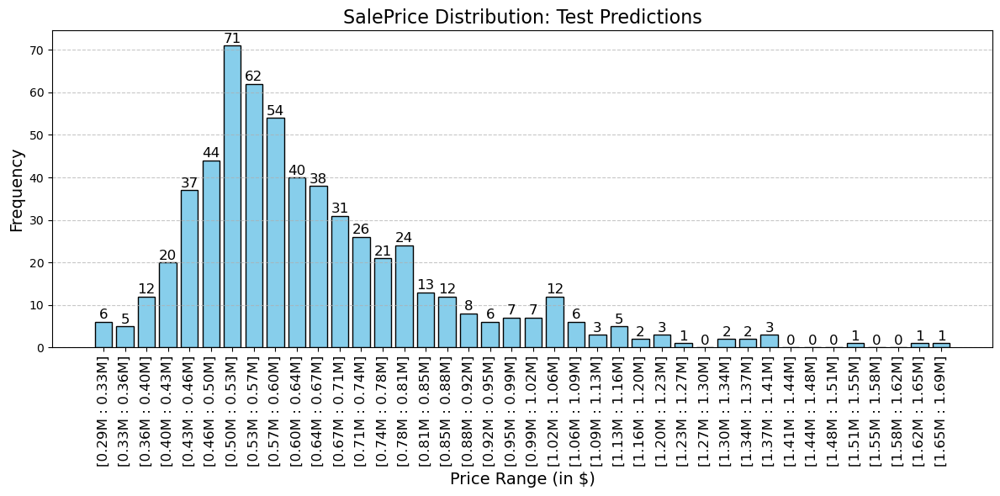

In [92]:
#Y pred visualize
visualize_saleprice_distribution(df_y_pred, "Test Predictions")

From the distributions of Y_train and Y_pred_test, we can observe that they have relatively similar distributions and are within the same range of values.

In [172]:
# Save the predictions to a CSV file
df_y_pred.to_csv('group_2_output.csv', index=False)

### 10. XAI

**SHAP vs. LIME – Understanding Model Interpretability**

**SHAP (Shapley Additive Explanations)**
SHAP is a powerful explainability method based on Shapley values from cooperative game theory. It assigns each feature an importance value representing its contribution to a specific model prediction.

**Key Properties:**
- **Efficiency**: The sum of all SHAP values plus the expected model output equals the actual prediction.
- **Symmetry**: If two features contribute equally in all cases, they receive the same SHAP value.
- **Dummy**: A feature with zero SHAP value does not influence the prediction.
- **Additivity**: SHAP values can be combined across ensemble models.
- **Consistency**: If a model is changed such that a feature’s contribution increases, its SHAP value will also increase.

**Advantages:**
- **Global Interpretability**: Aggregated SHAP values show overall feature importance.
- **Local Interpretability**: SHAP provides instance-specific explanations.
- **Fair Attribution**: Ensures a mathematically sound distribution of feature contributions.
- **GDPR Compliance**: Provides transparency with minimal assumptions.

**Drawbacks:**
- Computationally expensive, especially with many features.
- Sensitive to correlated features.
- Provides importance for the model, not necessarily real-world causality.

**LIME (Local Interpretable Model-Agnostic Explanations)**
LIME explains individual predictions by approximating the model with a locally weighted linear regression.

**How It Works:**
1. Generates perturbed samples around the instance being explained.
2. Evaluates the black-box model on these samples.
3. Trains a simple interpretable model (e.g., linear regression) on this local dataset.
4. Uses the coefficients of this local model to explain feature importance.

**Advantages:**
- Works with any model.
- Provides quick, interpretable local explanations.
- Can be used for tabular, text, and image data.

**Drawbacks:**
- Relies on random sampling, making it unstable.
- Local approximation may not always reflect the true model behavior.
- Less reliable for high-dimensional data.

Both SHAP and LIME are valuable tools for model interpretability, with SHAP offering more rigorous theoretical guarantees and LIME being faster and more flexible. The choice depends on the use case—SHAP for deeper analysis and LIME for quick insights.


#### SHAP

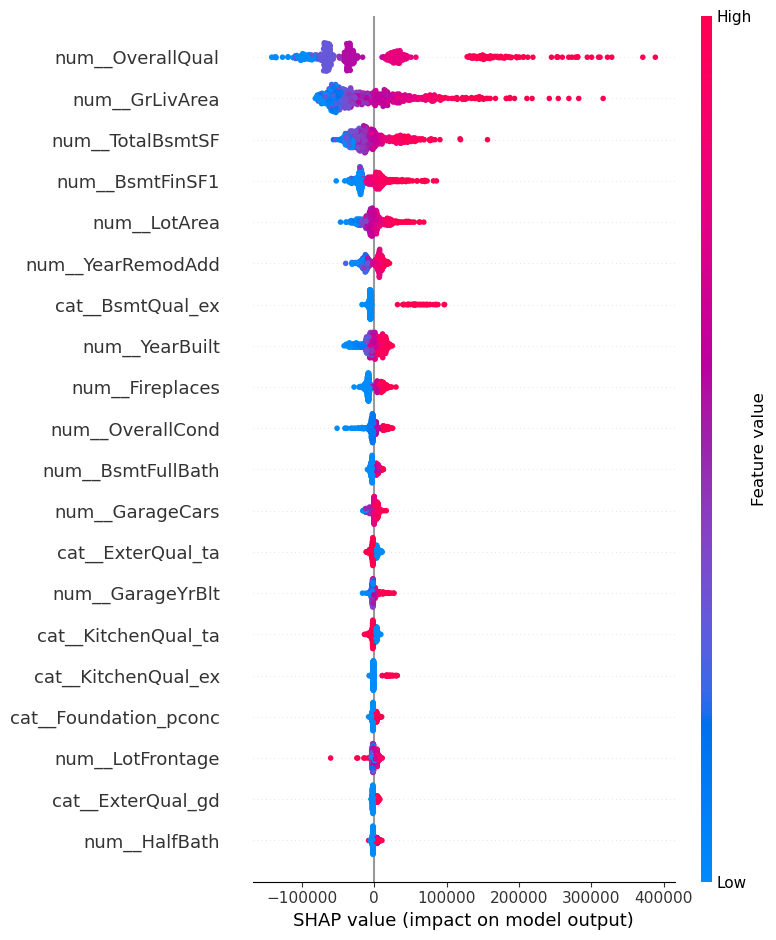

In [98]:
#SHAP Explanation
internal_regressor = model  # Extract the internal XGBRegressor
explainer_shap = shap.TreeExplainer(internal_regressor)
shap_values = explainer_shap.shap_values(xv)

# Plot SHAP summary
shap.summary_plot(shap_values, xv, feature_names=xt.columns)

SHAP Summary Plot Analysis  

The given plot is a **SHAP (SHapley Additive Explanations) summary plot**, which helps analyze the impact of features on a machine learning model’s predictions.  

**Key Insights from the SHAP Plot**  

**1. Feature Importance**  
- The **Y-axis** lists the features ranked by importance.  
- The **top features** (e.g., `num__OverallQual`, `num__GrLivArea`, `num__TotalBsmtSF`) have the highest influence on model predictions.  
- Features at the bottom (e.g., `num__HalfBath`) have less impact.  

**2. SHAP Value Interpretation**  
- The **X-axis** represents SHAP values, indicating how much each feature increases or decreases the prediction.  
- **Positive SHAP values (right side)** → Increase the predicted target value (e.g., house price).  
- **Negative SHAP values (left side)** → Decrease the predicted target value.  

**3. Feature Value Influence (Color Representation)**  
- **Color scale:**  
  - **Blue** represents **low feature values**.  
  - **Pink/Red** represents **high feature values**.  
- Example:  
  - In `num__OverallQual`, **higher values (red) increase the prediction** (shift right).  
  - **Lower values (blue) decrease the prediction** (shift left).  

**4. Variability of Feature Impact**  
- Each dot represents a sample from the dataset.  
- Features with **wide spread dots** have a **highly variable impact**, meaning they influence predictions differently across samples.  

**Key Takeaways**  
- **Most impactful features:** `num__OverallQual`, `num__GrLivArea`, and `num__TotalBsmtSF` significantly affect model predictions.  
- **Higher values of features like `num__OverallQual` lead to higher predictions**.  
- **Year-related features (`num__YearBuilt`, `num__YearRemodAdd`) and quality-related features (`cat__KitchenQual_ex`, `cat__ExterQual_ta`) are also important.**    

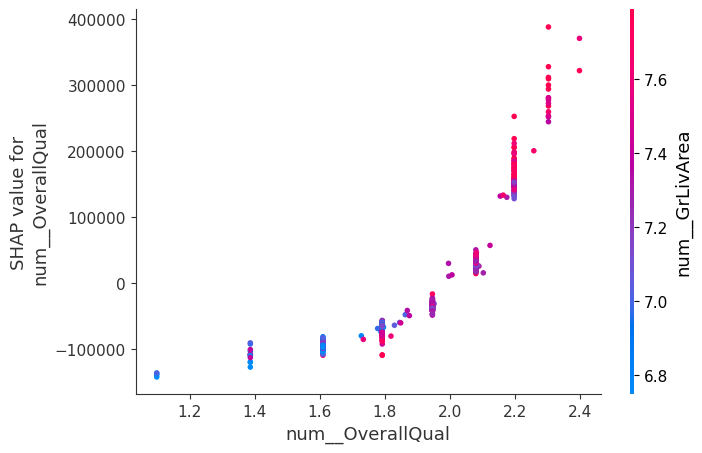

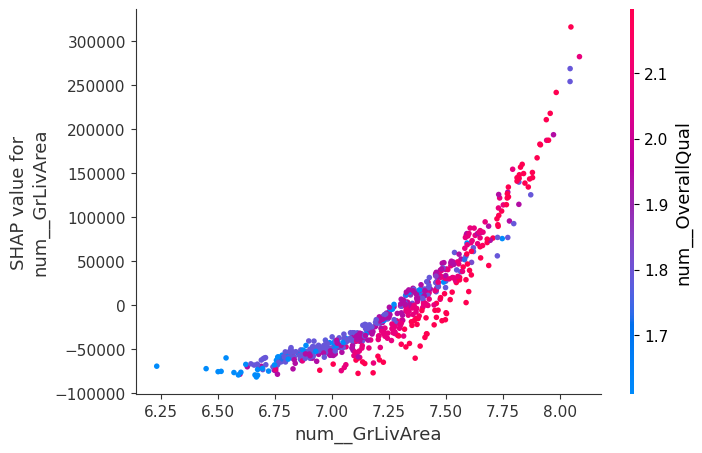

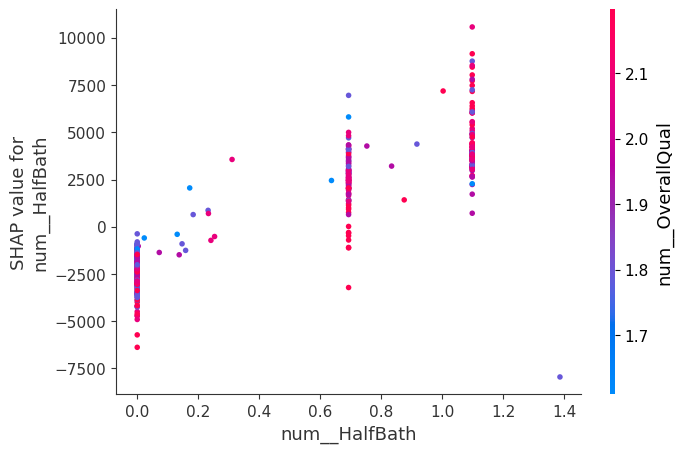

In [124]:
features = ['num__OverallQual','num__GrLivArea','num__HalfBath']
for feature in features:  
    shap.dependence_plot(feature, shap_values, xv, feature_names=xt.columns)

The following SHAP dependence plots illustrate how different features influence the model's predictions:

1. **First Plot:**
   - X-axis: `num__OverallQual` (Overall Quality of the house).
   - Y-axis: SHAP value for `num__OverallQual`, indicating its contribution to the prediction.
   - Colors: Represent `num__GrLivArea` (Above-ground living area).
   - Insight: As the overall quality increases, its impact on price prediction grows almost exponentially.

2. **Second Plot:**
   - X-axis: `num__GrLivArea` (Above-ground living area).
   - Y-axis: SHAP value for `num__GrLivArea`, showing its contribution to price prediction.
   - Colors: Represent `num__OverallQual`.
   - Insight: The larger the living area, the greater its influence on price, following a non-linear pattern.

3. **Third Plot:**
   - X-axis: `num__HalfBath` (Number of half bathrooms).
   - Y-axis: SHAP value for `num__HalfBath`.
   - Colors: Represent `num__OverallQual`.
   - Insight: Half bathrooms positively impact price predictions, but their influence is significantly smaller compared to the other two features.

Overall, `OverallQual` and `GrLivArea` are the most influential features, with an almost exponential impact on price, while `HalfBath` has a positive but much smaller effect.


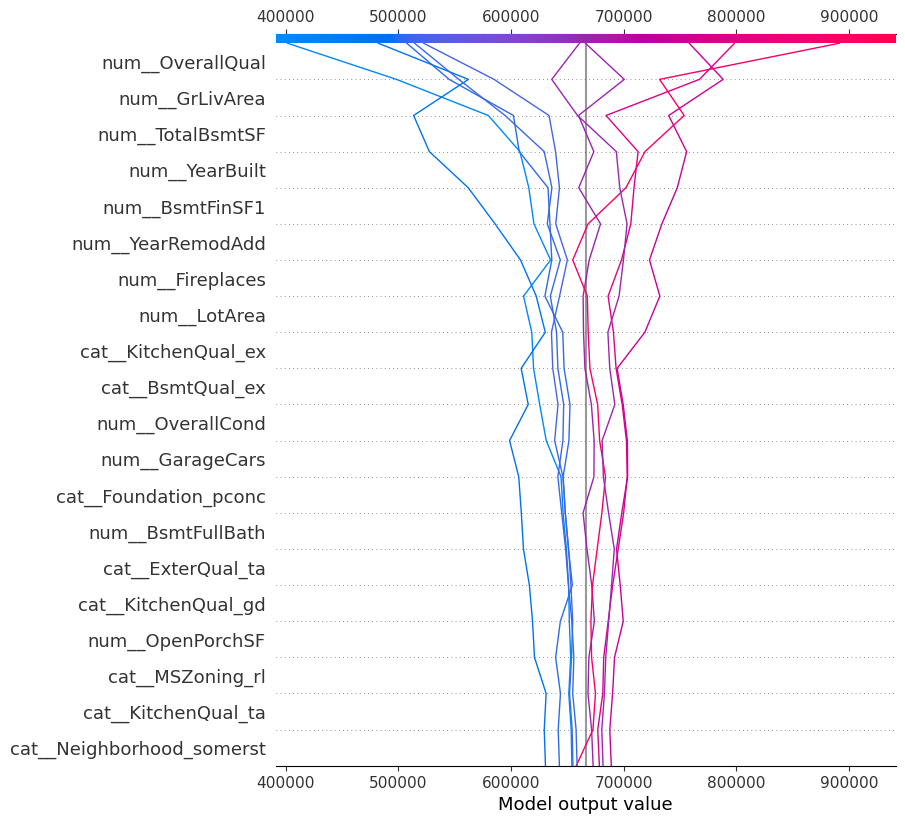

In [126]:
shap.decision_plot(explainer_shap.expected_value, shap_values[:10], feature_names=xt.columns.to_numpy())

- `num__OverallQual` and `num__GrLivArea` have the strongest influence on price prediction.  
- `num__TotalBsmtSF` and `num__YearBuilt` also contribute significantly but with varying effects across samples.  
- Categorical features like `cat__KitchenQual_ex` positively impact price estimation.  
- Features on the right (pink/red) increase the predicted price, while those on the left (blue) decrease it.  
- The plot illustrates how the model accumulates feature contributions to arrive at a final prediction for each sample.  

#### Lime

In [128]:
explainer = LimeTabularExplainer(
    training_data=xt.to_numpy(),
    feature_names=xt.columns,
    mode="regression")

In [129]:
# Choose a random test instance to explain
def lime_instance(explainer,model,idx, X_test_scaled,num_features = 10):  
    lime_exp = explainer.explain_instance(X_test_scaled[idx], model.predict, num_features=num_features)
    # Show LIME explanation
    lime_exp.show_in_notebook()

#### Local Interpretability

###### Idx1

In [147]:
shap.initjs()
idx1 = 482 #np.random.randint(0, xv.shape[0])
print("Random index chosen for explanation:", idx1)
shap.force_plot(explainer_shap.expected_value, shap_values[idx1], xv.iloc[idx1], feature_names=xt.columns)

Random index chosen for explanation: 482


In [149]:
print("Random index chosen for explanation:", idx1)
lime_instance(explainer,model,idx1, xv.to_numpy(),num_features = 40)

Random index chosen for explanation: 482


###### Idx2

In [152]:
shap.initjs()
idx2 = 278 #np.random.randint(0, xv.shape[0])
print("Random index chosen for explanation:", idx2)
shap.force_plot(explainer_shap.expected_value, shap_values[idx2], xv.iloc[idx2], feature_names=xt.columns)

Random index chosen for explanation: 278


In [154]:
lime_instance(explainer,model,idx2, xv.to_numpy(),num_features = 40)

###### Idx3

In [156]:
shap.initjs()
idx3 =  348 #np.random.randint(0, xv.shape[0])
print("Random index chosen for explanation:", idx3)
shap.force_plot(explainer_shap.expected_value, shap_values[idx3], xv.iloc[idx3], feature_names=xt.columns)

Random index chosen for explanation: 348


In [158]:
lime_instance(explainer,model,idx3, xv.to_numpy(),num_features = 40)

It is easy to see that the different methods produce similar, but clearly not identical, results.
The top 5 features in each method share common features, but not all of them are the same.
More specifically, in Idx1 (482):
it is clear to see that the features num_OverallQual, and num_Total_bsmtSF are most impactful in both methods,
but the following features are mixed: num_YearRemodAdd and num_BsmtFinSF1 are ranked higher in SHAP, but in Lime these features are slightly out ranked by cat_BsmtQual_ex and num_YearBuilt.
In Idx2 (278), both methods share the top feature, num_OverallQual, but the following features are mixed.
In Idx3 (348), the top feature in SHAP is only the 3rd most impactful in Lime.
To summarise, the methods do not agree completely, but show a similar story when looking at enough features.

#### Comparison of XAI Methods  
##### **Local Interpretability**
It is easy to see that the different methods produce similar, but not identical, results.  
The **top 5 features** in each method share common elements, but not all of them are the same.  

**Idx1 (482)**  
- The features **num_OverallQual** and **num_Total_bsmtSF** are the most impactful in both methods.  
- However, the ranking of other features differs:  
  - **SHAP:** *num_YearRemodAdd* and *num_BsmtFinSF1* are ranked higher.  
  - **LIME:** These features are slightly outranked by *cat_BsmtQual_ex* and *num_YearBuilt*.  

**Idx2 (278)**  
- Both methods agree on the **top feature**, **num_OverallQual**.  
- The ranking of the following features varies between the methods.  

**Idx3 (348)**  
- The **top feature in SHAP** is only the **third most impactful** in LIME.  

**Summary**  
While the methods do not completely agree, they tell a similar story when considering enough features.  


#### Global vs Local Explanation Consistency (Including LIME)

##### Summary

- The **global SHAP summary plot** and **local SHAP force plots** show consistent results regarding the most impactful features, with some variations observed in **LIME**.

- **Key Features**:  
  The top features in the global analysis, such as `num__OverallQual`, `num__GrLivArea`, and `num__TotalBsmtSF`, are also identified as significant in both **SHAP** and **LIME** local explanations.

- **Feature Influence**:  
  The SHAP summary plot shows that higher values of certain features (e.g., `num__OverallQual`) tend to increase the predicted target (e.g., house price), and lower values decrease it. This trend is similarly observed in **SHAP force plots**. In **LIME**, the same features tend to influence predictions in a comparable way, but with some minor differences in their ranking.

- **Variability**:  
  The global plot indicates some features have a broad spread in terms of their impact. Similarly, in **local SHAP** and **LIME** explanations, the impact of features like `num__OverallQual` can vary across instances. However, **LIME** sometimes ranks these features differently than **SHAP**, as seen in cases like Idx1, where **LIME** ranks certain features higher or lower compared to **SHAP**.

##### Conclusion

- The global explanation provides a general understanding of which features are most impactful, and both **SHAP** and **LIME** local explanations support this overall view.  
- **LIME** introduces slight variations in feature rankings and their impact, but the key story is similar between the methods.
- The global trends are confirmed in the local analysis, but **LIME** offers a different perspective on the relative importance of features in specific instances.

### LLM

We utilized various tools such as ChatGPT, Copilot, and Gemini primarily for tasks including idea generation, troubleshooting, rapid code writing, and commenting. Throughout the process, we engaged in numerous chat sessions, though most were not saved. Below are some examples of how these tools were used:  

- [Creating more visualizations for XAI](https://chatgpt.com/share/67d31ceb-df3c-800d-9126-ce18342422b4)  
- [Outlier detection methods](https://chatgpt.com/share/67d31e9c-a780-8012-9261-8be23f0ec1d3)  
- [Feature importance](https://chatgpt.com/share/67d31f20-cd80-8012-9a77-2ab948b05f90)  
- [Data cleaning](https://chatgpt.com/share/67d31ec6-37bc-8012-b88a-a72b98a2647d)  
- [Numeric columns access error](https://chatgpt.com/share/67d31f9c-c17c-8012-b85e-7b9eda1a4cd0)  

Many more conversations took place, but they were not saved or attached.
